In [28]:
import numpy as np
import matplotlib.pyplot as plt
'''
# Defining an environment:
    - 4 DOF robotic arm with arbitrary link lengths
    - Target
    - Obstacles
'''
class MultiArmRoboticEnv:
    def __init__(self, num_links=4, target=(1.0, 1.0, 1.0)):
        self.num_links = num_links
        self.link_length = [0.5, 0.8, 0.8, 0.5]
        self.angles = [0,0,0,0]
        self.target = target
        self.obstacles = [(0.5, 0.5, 0.5), (1.5, 1.5, 1.5)]
        self.steps = 0
        self.reset()

    def reset(self):
        self.angles = [0,0,0,0]
        self.steps = 0
        return self.angles

    def get_end_effector(self, arm_index):
        x = 0
        y = 0
        z = 0
        if arm_index == 1:
            x = 0
            y = 0
            z = self.link_length[0]
        elif arm_index == 2:
            x = np.cos(self.angles[0]) * (self.link_length[1] * np.cos(self.angles[1]))
            y = np.sin(self.angles[0]) * (self.link_length[1] * np.cos(self.angles[1]))
            z = self.link_length[0] + self.link_length[1] * np.sin(self.angles[1])
        elif arm_index == 3:
            x = np.cos(self.angles[0]) * \
            (self.link_length[1] * np.cos(self.angles[1]) + self.link_length[2] * np.cos(self.angles[1] + self.angles[2]))
            y = np.sin(self.angles[0]) * \
            (self.link_length[1] * np.cos(self.angles[1]) + self.link_length[2] * np.cos(self.angles[1] + self.angles[2]))
            z = self.link_length[0] + self.link_length[1] * np.sin(self.angles[1]) + self.link_length[2] * np.sin(self.angles[1] + self.angles[2]) 
        elif arm_index == 4:
            x = np.cos(self.angles[0]) * (self.link_length[1] * np.cos(self.angles[1]) + self.link_length[2] * np.cos(self.angles[1] + self.angles[2]) + self.link_length[3] * np.cos(self.angles[1] + self.angles[2] + self.angles[3]) ) 
            y = np.sin(self.angles[0]) * (self.link_length[1] * np.cos(self.angles[1]) + self.link_length[2] * np.cos(self.angles[1] + self.angles[2]) + self.link_length[3] * np.cos(self.angles[1] + self.angles[2] + self.angles[3])) 
            z = self.link_length[0] + self.link_length[1] * np.sin(self.angles[1]) + self.link_length[2] * np.sin(self.angles[1] + self.angles[2]) + self.link_length[3] * np.sin(self.angles[1] + self.angles[2] + self.angles[3]) 
        return (x, y, z)

    def step(self, actions):
        action_map = {0: -0.1, 1: 0.1}
        rewards = 0
        self.steps += 1

        for j in range(len(self.angles)):
            end_effector = self.get_end_effector(self.num_links-1)
            distance_old = np.linalg.norm(np.array(end_effector) - np.array(self.target))
            self.angles[j] = np.clip(self.angles[j] + action_map[actions[j]], -np.pi, np.pi)
            end_effector = self.get_end_effector(self.num_links-1)
            distance_new = np.linalg.norm(np.array(end_effector) - np.array(self.target))
            
            if distance_old > distance_new:
                rewards += 1
            else:
                rewards -= 1
                
            for obs in self.obstacles:
                if np.linalg.norm(np.array(end_effector) - np.array(obs)) < 0.2:
                    rewards -= 2000           
        
        # rewards -= 1  # Penalize based on the number of steps
        # rewards -= 0.1 * self.steps
        done = False
        if np.linalg.norm(np.array(self.get_end_effector(self.num_links)) - np.array(self.target)) < 0.1:
            rewards += 50000;
            done = True
            
        return self.angles, rewards, done

    def render(self):
        for i in range(self.num_links):
            print(f"Link {i+1} Joint Angle: {self.angles[i]}")
        end_effector = self.get_end_effector(self.num_links)
        print(f"End Effector: {end_effector}")

In [30]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def draw_robot(points, target):

    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(0, 0, 0, color='blue', s=100)
    
    for i in range(len(points)):
        if i==len(points)-1:
            ax.scatter(points[i][0], points[i][1], points[i][2], color='red', s=100)
        else:
            ax.scatter(points[i][0], points[i][1], points[i][2], color='blue', s=100)

    for i in range(len(points)-1):
        ax.plot([points[i][0], points[i+1][0]], [points[i][1], points[i+1][1]], [points[i][2], points[i+1][2]], color='black')
    ax.plot([0, points[0][0]], [0, points[0][1]], [0, points[0][2]], color='black')

    ax.scatter(target[0], target[1], target[2], color='green', s=50)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    ax.set_xlim([-2,2])
    ax.set_ylim([-2,2])
    ax.set_zlim([0,3])
    
    plt.show()

    return fig

In [32]:
del env

Episode 1/1000, Total Reward: -599600, Epsilon: 0.4975, steps: 1490 , Done: True
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: -2.400000000000001
Link 3 Joint Angle: -1.841592653589792
Link 4 Joint Angle: 0.40000000000000024
End Effector: (0.93025182987969, 0.9578231518107863, 0.994704187227073)


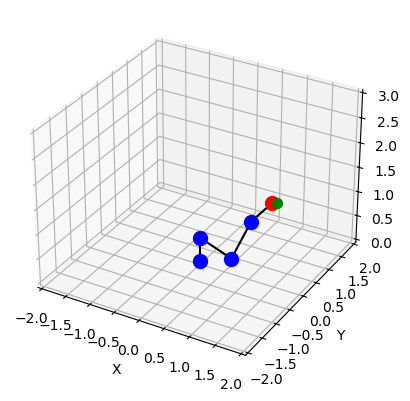

Episode 2/1000, Total Reward: -5636, Epsilon: 0.4950125, steps: 5000 , Done: False
Link 1 Joint Angle: -1.3584073464102087
Link 2 Joint Angle: -2.1415926535897922
Link 3 Joint Angle: -3.141592653589793
Link 4 Joint Angle: -3.141592653589793
End Effector: (-0.05694672824988356, 0.264080888315003, 0.07926450759605164)


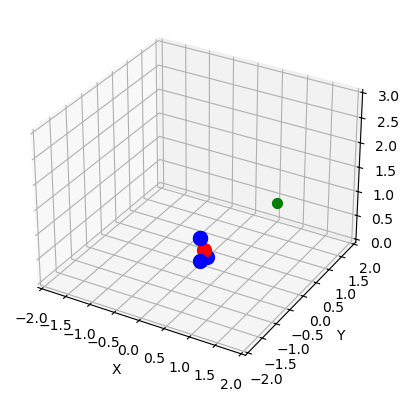

Episode 3/1000, Total Reward: -5514, Epsilon: 0.4925374375, steps: 5000 , Done: False
Link 1 Joint Angle: -2.041592653589792
Link 2 Joint Angle: 2.4415926535897925
Link 3 Joint Angle: 0.5415926535897913
Link 4 Joint Angle: -2.6415926535897927
End Effector: (0.4221829549935078, 0.8294880379492697, 1.3090647801827056)


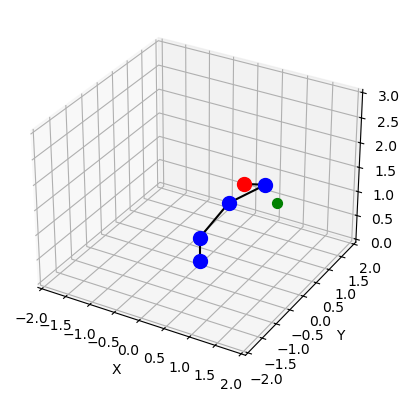

Episode 4/1000, Total Reward: 48826, Epsilon: 0.49007475031250003, steps: 1050 , Done: True
Link 1 Joint Angle: -2.400000000000001
Link 2 Joint Angle: 2.2000000000000006
Link 3 Joint Angle: 0.5999999999999998
Link 4 Joint Angle: 1.6
End Effector: (1.0163093499344515, 0.9309538872686506, 0.9389866062356376)


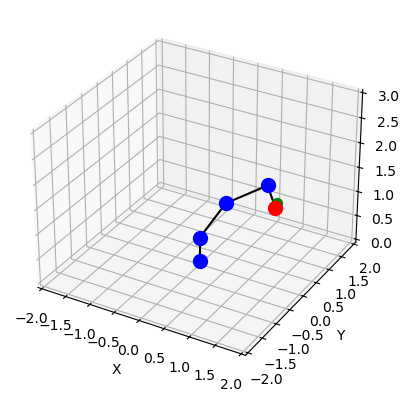

Episode 5/1000, Total Reward: -295058, Epsilon: 0.48762437656093754, steps: 4741 , Done: True
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: 2.6415926535897927
Link 3 Joint Angle: -0.2584073464102087
Link 4 Joint Angle: 1.8584073464102093
End Effector: (1.051755383160069, 1.082927895086888, 0.9881496781998256)


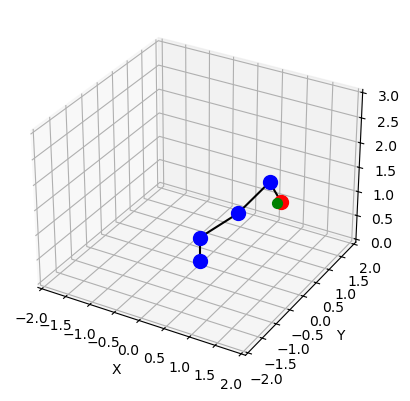

Episode 6/1000, Total Reward: 49688, Epsilon: 0.48518625467813287, steps: 296 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: 0.6
Link 3 Joint Angle: -1.2
Link 4 Joint Angle: 1.8000000000000003
End Effector: (1.0462555159571219, 1.077265019756075, 0.9660195429836131)


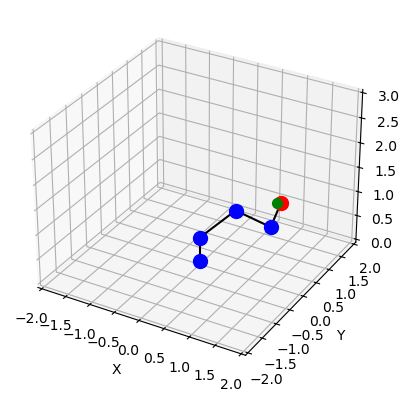

Episode 7/1000, Total Reward: -869348, Epsilon: 0.4827603234047422, steps: 5000 , Done: False
Link 1 Joint Angle: -2.041592653589792
Link 2 Joint Angle: -1.941592653589792
Link 3 Joint Angle: -2.4415926535897925
Link 4 Joint Angle: -2.941592653589793
End Effector: (0.1343074550189389, 0.26388186928894986, 0.07980411805171345)


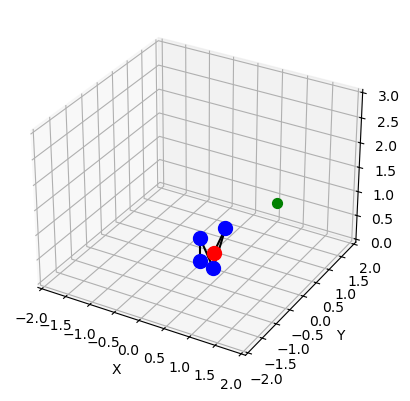

Episode 8/1000, Total Reward: 49162, Epsilon: 0.4803465217877185, steps: 866 , Done: True
Link 1 Joint Angle: 0.7415926535897913
Link 2 Joint Angle: -0.6000000000000003
Link 3 Joint Angle: 1.8000000000000003
Link 4 Joint Angle: -0.7999999999999997
End Effector: (1.0402303955643541, 0.9528659068895692, 0.988626461212078)


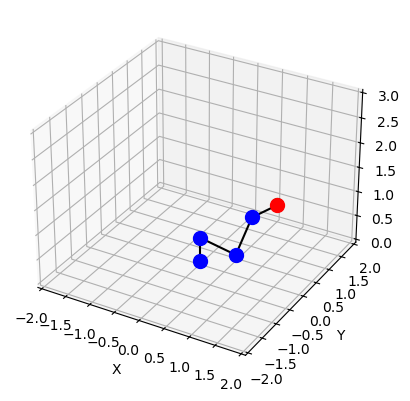

Episode 9/1000, Total Reward: -717600, Epsilon: 0.47794478917877986, steps: 5000 , Done: False
Link 1 Joint Angle: -2.7415926535897928
Link 2 Joint Angle: -2.1415926535897922
Link 3 Joint Angle: -1.7415926535897919
Link 4 Joint Angle: -3.041592653589793
End Effector: (0.5725177065729259, 0.24205660394655806, 0.06795768454262424)


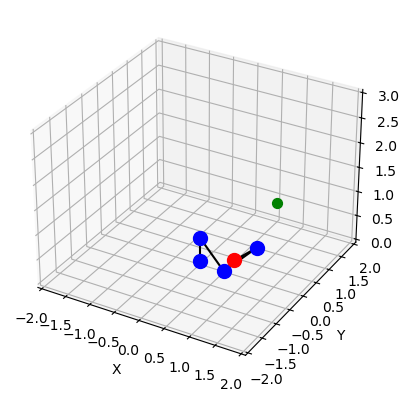

Episode 10/1000, Total Reward: -571486, Epsilon: 0.47555506523288593, steps: 5000 , Done: False
Link 1 Joint Angle: 1.5415926535897917
Link 2 Joint Angle: -0.9415926535897913
Link 3 Joint Angle: 2.041592653589792
Link 4 Joint Angle: 1.941592653589792
End Effector: (0.009816170091825104, 0.33603236400618475, 0.6160854733168916)


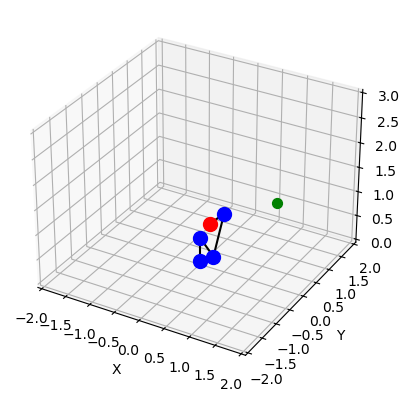

Episode 11/1000, Total Reward: 46140, Epsilon: 0.4731772899067215, steps: 3460 , Done: True
Link 1 Joint Angle: -2.3584073464102095
Link 2 Joint Angle: 2.841592653589793
Link 3 Joint Angle: -0.6584073464102087
Link 4 Joint Angle: 2.041592653589792
End Effector: (1.0335145623053008, 1.0289506159619652, 0.9493105263205257)


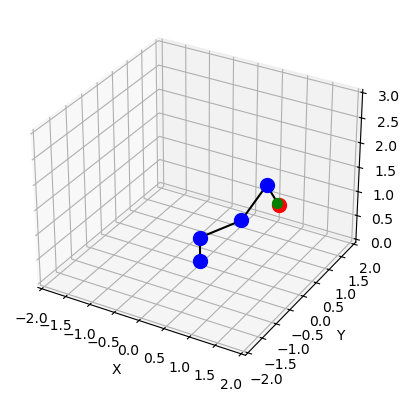

Episode 12/1000, Total Reward: -661908, Epsilon: 0.47081140345718786, steps: 5000 , Done: False
Link 1 Joint Angle: -2.6415926535897927
Link 2 Joint Angle: -0.8415926535897913
Link 3 Joint Angle: -2.941592653589793
Link 4 Joint Angle: -2.841592653589793
End Effector: (-0.31875298868283564, -0.17413555136258294, 0.21471947046383766)


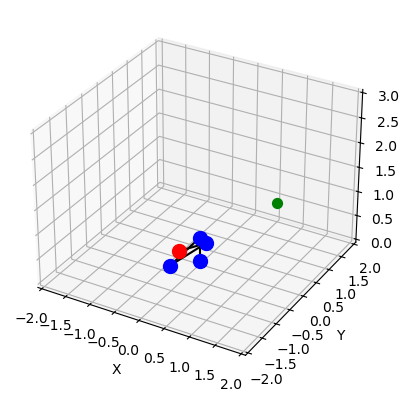

Episode 13/1000, Total Reward: -404964, Epsilon: 0.46845734643990194, steps: 2709 , Done: True
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: -2.841592653589793
Link 3 Joint Angle: -1.6415926535897918
Link 4 Joint Angle: 1.3584073464102087
End Effector: (1.0074101625102199, 1.037268346084897, 1.034254989131307)


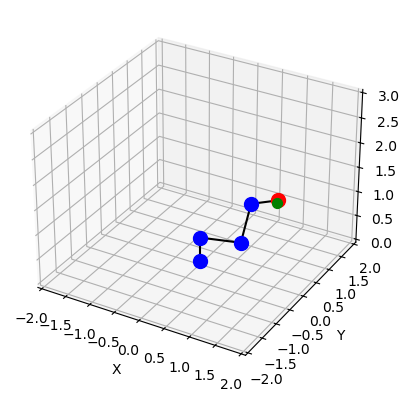

Episode 14/1000, Total Reward: -181760, Epsilon: 0.46611505970770245, steps: 5000 , Done: False
Link 1 Joint Angle: -1.6415926535897918
Link 2 Joint Angle: -2.6000000000000014
Link 3 Joint Angle: -2.2415926535897923
Link 4 Joint Angle: -2.2415926535897923
End Effector: (0.016558309360505633, 0.23349567390767914, 0.5222527054550428)


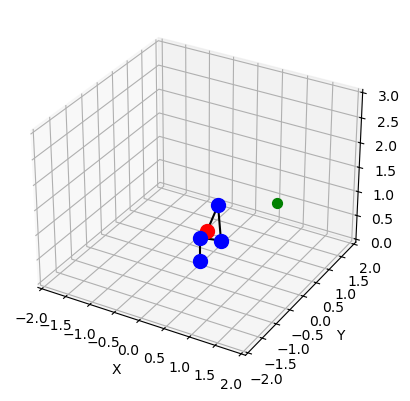

Episode 15/1000, Total Reward: -307808, Epsilon: 0.4637844844091639, steps: 5000 , Done: False
Link 1 Joint Angle: -2.041592653589792
Link 2 Joint Angle: -2.2415926535897923
Link 3 Joint Angle: -2.2415926535897923
Link 4 Joint Angle: -2.841592653589793
End Effector: (0.19351617018202688, 0.3802127641989119, 0.22081189367613224)


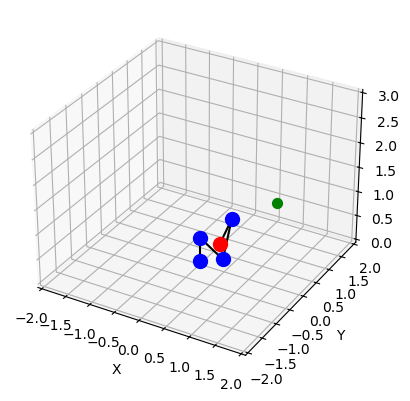

Episode 16/1000, Total Reward: -190042, Epsilon: 0.4614655619871181, steps: 1842 , Done: True
Link 1 Joint Angle: 0.7999999999999997
Link 2 Joint Angle: 1.1999999999999997
Link 3 Joint Angle: -1.1415926535897913
Link 4 Joint Angle: -0.8415926535897913
End Effector: (1.0052480907743724, 1.0350421936625576, 0.9395604207306514)


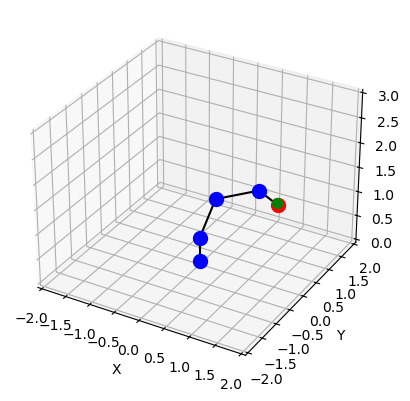

Episode 17/1000, Total Reward: -73874, Epsilon: 0.4591582341771825, steps: 1663 , Done: True
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: -2.3415926535897924
Link 3 Joint Angle: -1.7415926535897919
Link 4 Joint Angle: 0.05840734641020867
End Effector: (0.9374277250816082, 0.965211730192034, 0.9592944941140448)


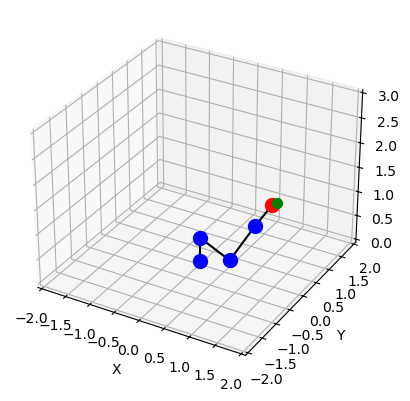

Episode 18/1000, Total Reward: -515446, Epsilon: 0.4568624430062966, steps: 5000 , Done: False
Link 1 Joint Angle: -2.7415926535897928
Link 2 Joint Angle: -2.7415926535897928
Link 3 Joint Angle: -1.3415926535897915
Link 4 Joint Angle: -2.4415926535897925
End Effector: (0.665163176599731, 0.281226480420701, 0.7156377846017604)


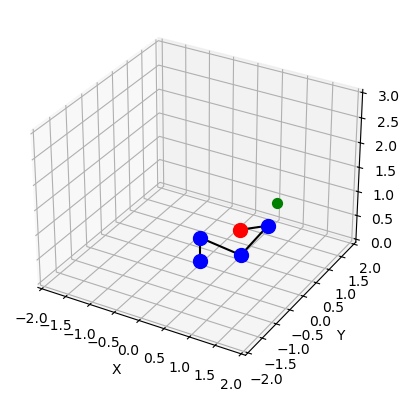

Episode 19/1000, Total Reward: -1533628, Epsilon: 0.4545781307912651, steps: 5000 , Done: False
Link 1 Joint Angle: -2.841592653589793
Link 2 Joint Angle: -0.04159265358979139
Link 3 Joint Angle: -2.841592653589793
Link 4 Joint Angle: -3.041592653589793
End Effector: (-0.47202976243306516, -0.146015916415166, 0.4376942022767131)


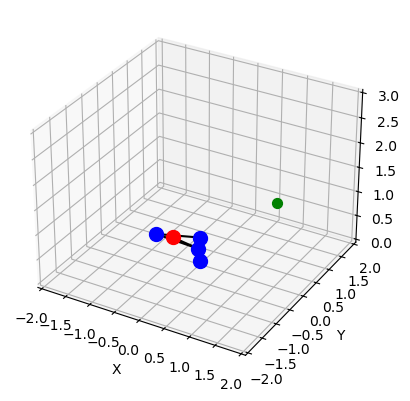

Episode 20/1000, Total Reward: -679558, Epsilon: 0.4523052401373088, steps: 5000 , Done: False
Link 1 Joint Angle: -2.941592653589793
Link 2 Joint Angle: -2.7415926535897928
Link 3 Joint Angle: -1.5415926535897917
Link 4 Joint Angle: 0.4415926535897914
End Effector: (1.4232402944200018, 0.2885050906192525, 1.2380121112324696)


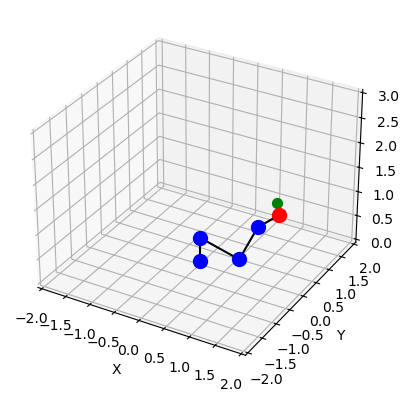

Episode 21/1000, Total Reward: -739872, Epsilon: 0.45004371393662224, steps: 5000 , Done: False
Link 1 Joint Angle: -2.041592653589792
Link 2 Joint Angle: -2.7415926535897928
Link 3 Joint Angle: -1.841592653589792
Link 4 Joint Angle: -2.1415926535897922
End Effector: (0.175944637330542, 0.34568892533629497, 0.7681072343981401)


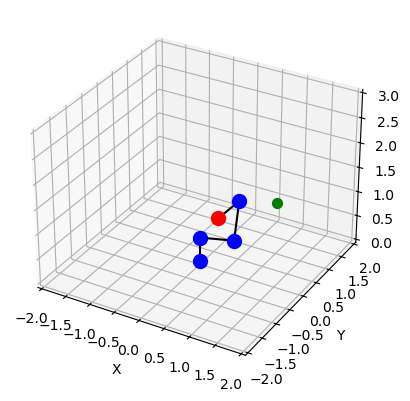

Episode 22/1000, Total Reward: -261944, Epsilon: 0.44779349536693913, steps: 3602 , Done: True
Link 1 Joint Angle: 0.7999999999999997
Link 2 Joint Angle: 0.04159265358979139
Link 3 Joint Angle: -0.041592653589791334
Link 4 Joint Angle: 1.841592653589792
End Effector: (1.0210645833470902, 1.0513274642527284, 1.0150436226552277)


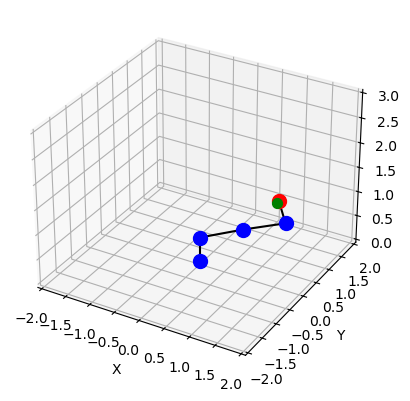

Episode 23/1000, Total Reward: -181590, Epsilon: 0.4455545278901044, steps: 5000 , Done: False
Link 1 Joint Angle: -2.841592653589793
Link 2 Joint Angle: -2.4415926535897925
Link 3 Joint Angle: -1.5415926535897917
Link 4 Joint Angle: -3.041592653589793
End Effector: (0.741529994260616, 0.22938210739762474, 0.24345842967564713)


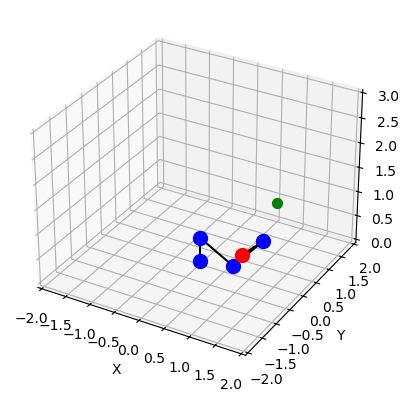

Episode 24/1000, Total Reward: 48506, Epsilon: 0.4433267552506539, steps: 1334 , Done: True
Link 1 Joint Angle: 0.8000000000000003
Link 2 Joint Angle: -0.7999999999999999
Link 3 Joint Angle: 1.7415926535897919
Link 4 Joint Angle: -0.19999999999999982
End Effector: (0.9732039070835775, 1.0020482666053119, 0.9106438406116284)


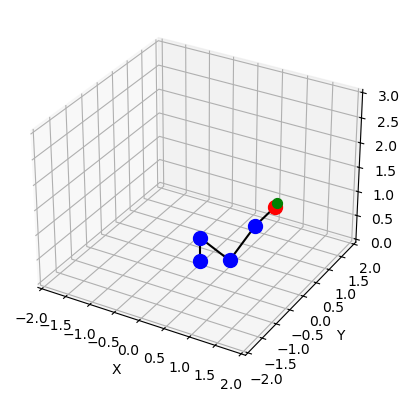

Episode 25/1000, Total Reward: 45004, Epsilon: 0.44111012147440065, steps: 4565 , Done: True
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: 1.841592653589792
Link 3 Joint Angle: 1.3000000000000005
Link 4 Joint Angle: 0.7415926535897913
End Effector: (0.9633335249179482, 0.9918853405547587, 0.933114958058181)


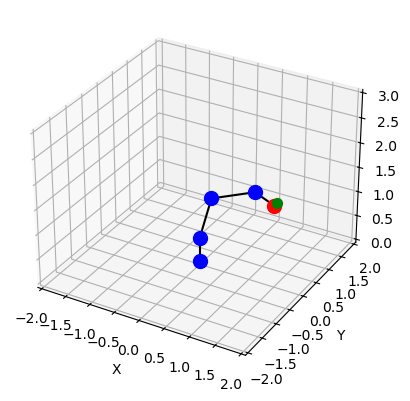

Episode 26/1000, Total Reward: -246520, Epsilon: 0.43890457086702866, steps: 4391 , Done: True
Link 1 Joint Angle: 0.7415926535897913
Link 2 Joint Angle: 1.3000000000000003
Link 3 Joint Angle: -1.758407346410209
Link 4 Joint Angle: 0.6415926535897913
End Effector: (1.0493407641635575, 0.9612111347106314, 1.007911445833917)


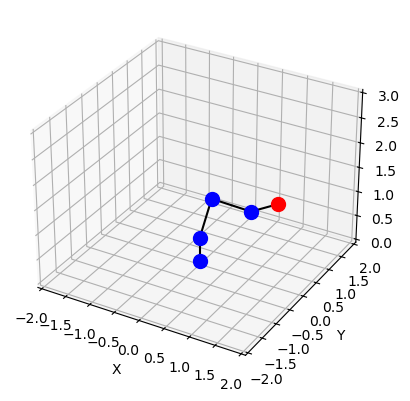

Episode 27/1000, Total Reward: -943476, Epsilon: 0.43671004801269353, steps: 5000 , Done: False
Link 1 Joint Angle: 0.6415926535897913
Link 2 Joint Angle: -1.2000000000000002
Link 3 Joint Angle: 2.1415926535897922
Link 4 Joint Angle: -2.6415926535897927
End Effector: (0.557808139497799, 0.41669511778606727, -0.09466655094434384)


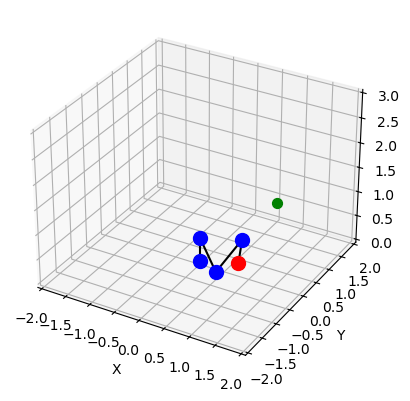

Episode 28/1000, Total Reward: 39006, Epsilon: 0.4345264977726301, steps: 2667 , Done: True
Link 1 Joint Angle: 0.8415926535897913
Link 2 Joint Angle: 0.9415926535897913
Link 3 Joint Angle: -0.5584073464102086
Link 4 Joint Angle: -1.558407346410209
End Effector: (0.9364194555634031, 1.0480534290518058, 0.9845107441134529)


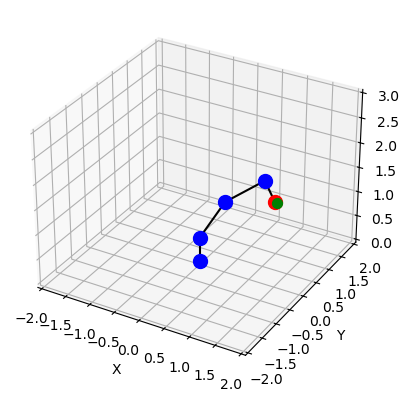

Episode 29/1000, Total Reward: 45108, Epsilon: 0.4323538652837669, steps: 4310 , Done: True
Link 1 Joint Angle: -2.400000000000001
Link 2 Joint Angle: 2.400000000000001
Link 3 Joint Angle: 0.19999999999999982
Link 4 Joint Angle: 1.7415926535897919
End Effector: (1.0740912641619358, 0.9838829463857094, 0.9867520989144781)


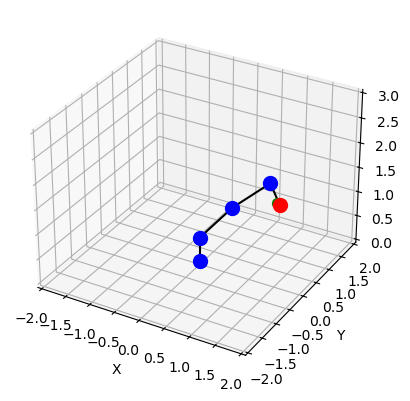

Episode 30/1000, Total Reward: -43882, Epsilon: 0.4301920959573481, steps: 5000 , Done: False
Link 1 Joint Angle: -0.5999999999999998
Link 2 Joint Angle: 0.9999999999999999
Link 3 Joint Angle: -0.15840734641020868
Link 4 Joint Angle: -1.4584073464102087
End Effector: (1.133289141013295, -0.7753248158611333, 1.4805210753935907)


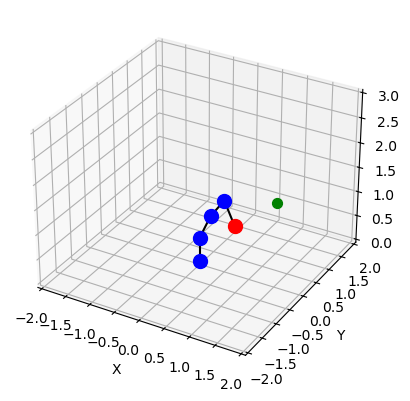

Episode 31/1000, Total Reward: 37932, Epsilon: 0.42804113547756134, steps: 1952 , Done: True
Link 1 Joint Angle: 0.8000000000000003
Link 2 Joint Angle: 1.4
Link 3 Joint Angle: -1.6000000000000005
Link 4 Joint Angle: 0.058407346410208616
End Effector: (0.9858561746653007, 1.0150755291415725, 1.0588643153247856)


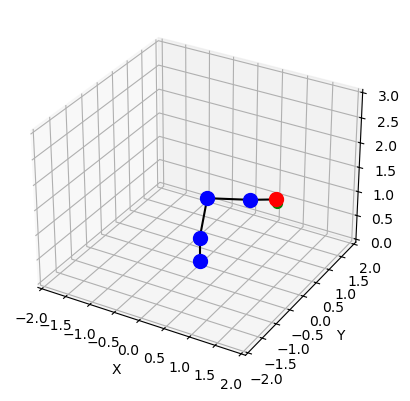

Episode 32/1000, Total Reward: -121448, Epsilon: 0.4259009298001735, steps: 5000 , Done: False
Link 1 Joint Angle: 0.7415926535897913
Link 2 Joint Angle: -2.2415926535897923
Link 3 Joint Angle: 3.141592653589793
Link 4 Joint Angle: 2.941592653589793
End Effector: (-0.2819949111422014, -0.25831136822143913, 0.17789115638115416)


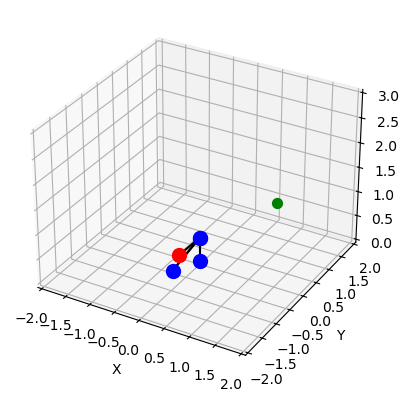

Episode 33/1000, Total Reward: -231774, Epsilon: 0.42377142515117266, steps: 5000 , Done: False
Link 1 Joint Angle: 1.5415926535897917
Link 2 Joint Angle: -0.9584073464102086
Link 3 Joint Angle: 2.1415926535897922
Link 4 Joint Angle: 1.3415926535897915
End Effector: (0.010347691712666092, 0.35422769529127945, 0.8752499392047576)


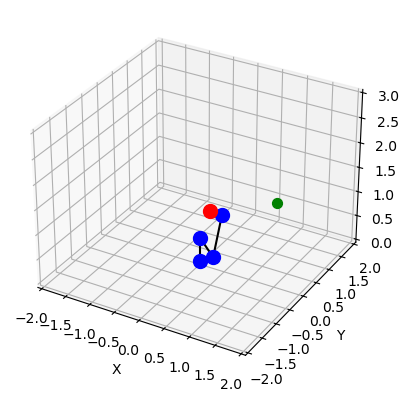

Episode 34/1000, Total Reward: -427790, Epsilon: 0.4216525680254168, steps: 5000 , Done: False
Link 1 Joint Angle: -1.5415926535897917
Link 2 Joint Angle: -2.4415926535897925
Link 3 Joint Angle: -2.5415926535897926
Link 4 Joint Angle: -2.841592653589793
End Effector: (-0.01119144474275894, 0.3831114985146571, 0.2556855970228487)


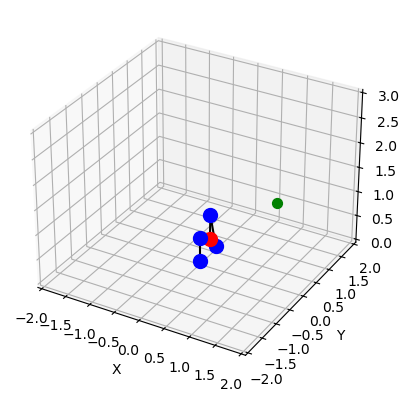

Episode 35/1000, Total Reward: -179540, Epsilon: 0.4195443051852897, steps: 5000 , Done: False
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: 2.5415926535897926
Link 3 Joint Angle: 0.2584073464102087
Link 4 Joint Angle: 1.5415926535897917
End Effector: (1.1114041288130438, 1.1443445434908812, 0.7536849558571387)


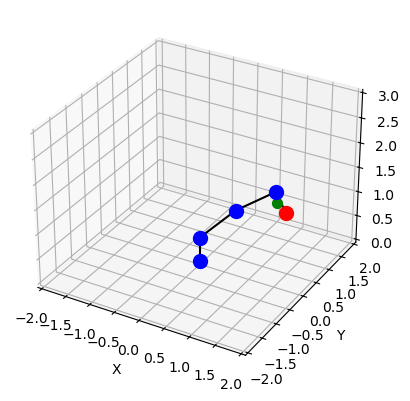

Episode 36/1000, Total Reward: 49694, Epsilon: 0.4174465836593632, steps: 308 , Done: True
Link 1 Joint Angle: 0.7999999999999997
Link 2 Joint Angle: -0.7999999999999999
Link 3 Joint Angle: 1.6000000000000003
Link 4 Joint Angle: 0.20000000000000004
End Effector: (0.9648565029460078, 0.9934534574539873, 0.9207354924039486)


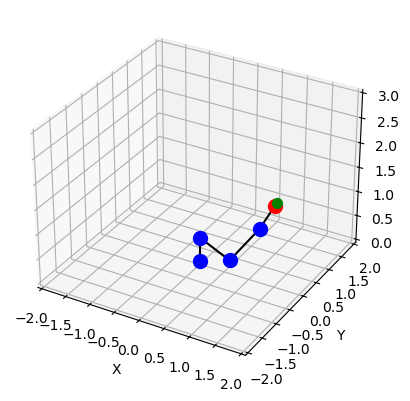

Episode 37/1000, Total Reward: -57540, Epsilon: 0.4153593507410664, steps: 5000 , Done: False
Link 1 Joint Angle: 1.3415926535897915
Link 2 Joint Angle: 1.4415926535897916
Link 3 Joint Angle: -2.6415926535897927
Link 4 Joint Angle: 1.7415926535897919
End Effector: (0.18662520371338667, 0.7999244581963381, 0.8054512654989243)


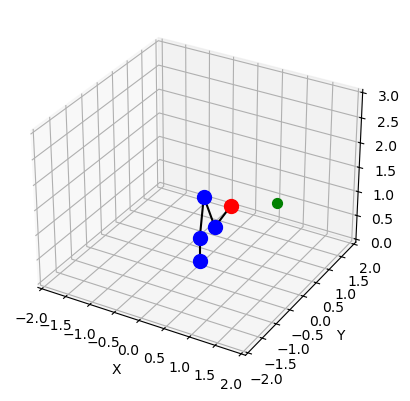

Episode 38/1000, Total Reward: 45564, Epsilon: 0.4132825539873611, steps: 3919 , Done: True
Link 1 Joint Angle: 0.7584073464102085
Link 2 Joint Angle: 0.2415926535897914
Link 3 Joint Angle: -0.4415926535897913
Link 4 Joint Angle: 2.1415926535897922
End Effector: (1.0015259099586358, 0.9488703346442902, 0.9984835417187489)


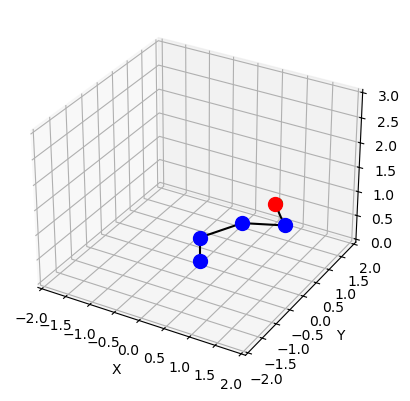

Episode 39/1000, Total Reward: 47226, Epsilon: 0.4112161412174243, steps: 622 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: -0.6
Link 3 Joint Angle: 1.6
Link 4 Joint Angle: -0.19999999999999982
End Effector: (1.0038594009805328, 1.0336123451070385, 1.0801408545800504)


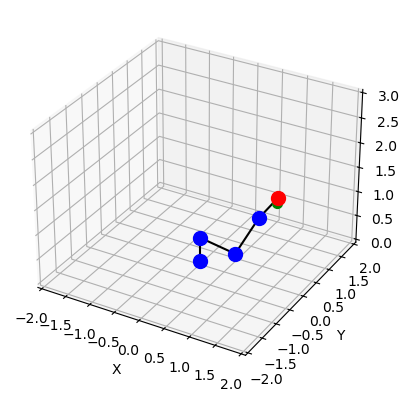

Episode 40/1000, Total Reward: -1603638, Epsilon: 0.40916006051133713, steps: 5000 , Done: False
Link 1 Joint Angle: -0.8415926535897913
Link 2 Joint Angle: -2.941592653589793
Link 3 Joint Angle: -3.141592653589793
Link 4 Joint Angle: -2.841592653589793
End Effector: (-0.2923561088404369, 0.3272089452585244, 0.26028723069789844)


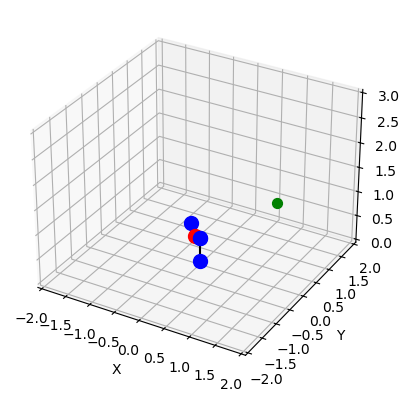

Episode 41/1000, Total Reward: 48510, Epsilon: 0.40711426020878044, steps: 1269 , Done: True
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: 1.7000000000000002
Link 3 Joint Angle: 1.5
Link 4 Joint Angle: 0.4999999999999998
End Effector: (0.9236668846175425, 0.9510430382728132, 0.9817144631656642)


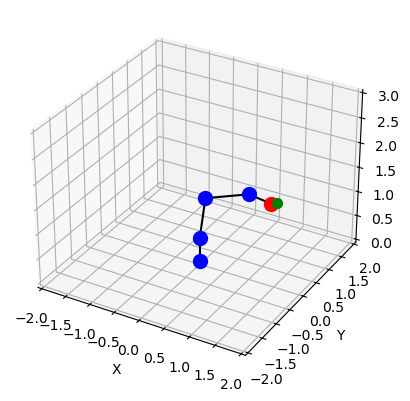

Episode 42/1000, Total Reward: -265822, Epsilon: 0.4050786889077365, steps: 1712 , Done: True
Link 1 Joint Angle: 0.7999999999999997
Link 2 Joint Angle: -0.20000000000000004
Link 3 Joint Angle: 1.6
Link 4 Joint Angle: -1.6000000000000005
End Effector: (0.982398447567315, 1.0115153200017273, 1.0300896539571884)


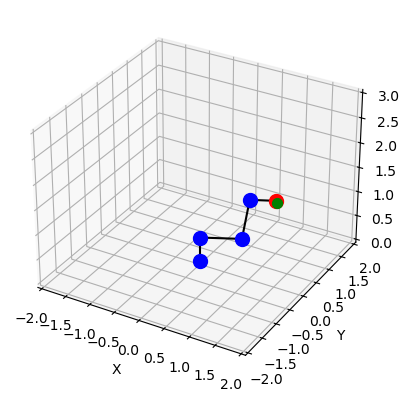

Episode 43/1000, Total Reward: -83274, Epsilon: 0.40305329546319785, steps: 4790 , Done: True
Link 1 Joint Angle: -2.4000000000000012
Link 2 Joint Angle: 3.141592653589793
Link 3 Joint Angle: 1.942890293094024e-16
Link 4 Joint Angle: -2.041592653589792
End Effector: (1.012590480199442, 0.9275473494499473, 0.9456036800307182)


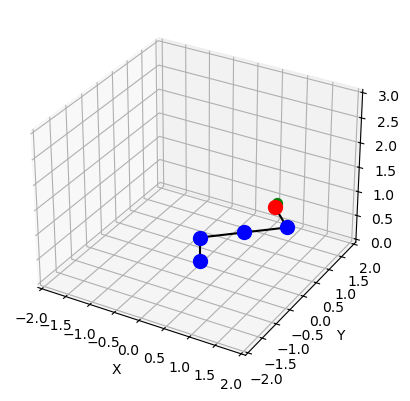

Episode 44/1000, Total Reward: 49702, Epsilon: 0.40103802898588187, steps: 289 , Done: True
Link 1 Joint Angle: -2.3000000000000007
Link 2 Joint Angle: 2.700000000000001
Link 3 Joint Angle: -0.5
Link 4 Joint Angle: 2.1000000000000005
End Effector: (0.9290940569781907, 1.0398547430240987, 1.0306180588680072)


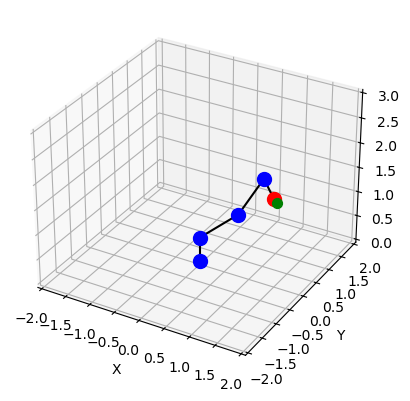

Episode 45/1000, Total Reward: -1061762, Epsilon: 0.3990328388409525, steps: 5000 , Done: False
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: -2.041592653589792
Link 3 Joint Angle: -3.141592653589793
Link 4 Joint Angle: -3.041592653589793
End Effector: (0.12622853936393538, 0.1299697711292577, 0.0339804570163868)


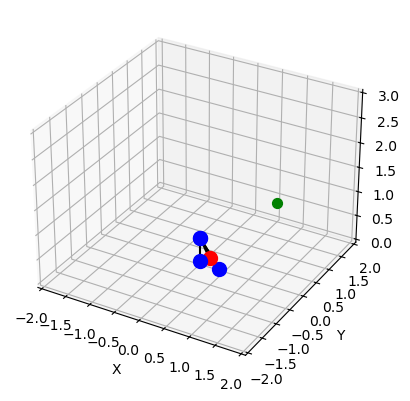

Episode 46/1000, Total Reward: -1027806, Epsilon: 0.3970376746467477, steps: 5000 , Done: False
Link 1 Joint Angle: -2.5415926535897926
Link 2 Joint Angle: -1.4415926535897916
Link 3 Joint Angle: -3.041592653589793
Link 4 Joint Angle: -2.7415926535897928
End Effector: (-0.17791304125835722, -0.12171686020885651, 0.08149805443078673)


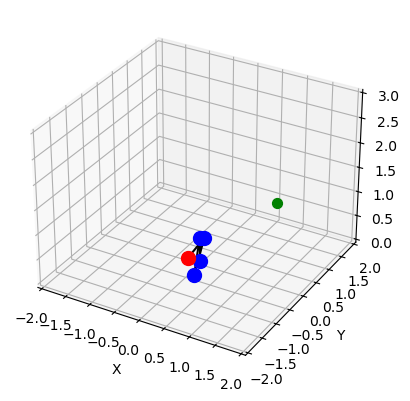

Episode 47/1000, Total Reward: -573700, Epsilon: 0.39505248627351397, steps: 5000 , Done: False
Link 1 Joint Angle: -0.2584073464102088
Link 2 Joint Angle: 0.4
Link 3 Joint Angle: 1.1415926535897913
Link 4 Joint Angle: -3.041592653589793
End Effector: (0.769162419074233, -0.2033026268733947, 1.1124460629780974)


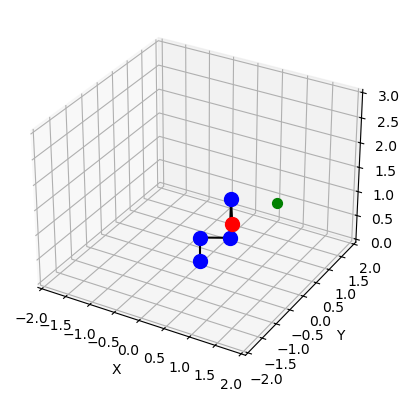

Episode 48/1000, Total Reward: -7754, Epsilon: 0.3930772238421464, steps: 5000 , Done: False
Link 1 Joint Angle: -2.041592653589792
Link 2 Joint Angle: -2.7415926535897928
Link 3 Joint Angle: -2.041592653589792
Link 4 Joint Angle: -2.2415926535897923
End Effector: (0.14132339466074914, 0.27766650445487023, 0.6487297251607483)


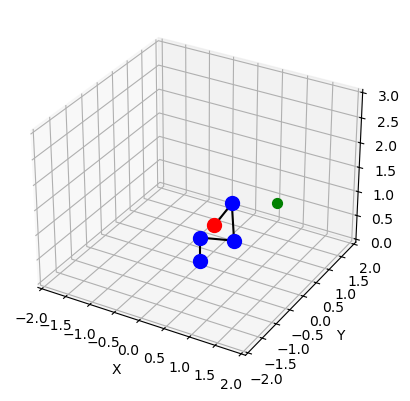

Episode 49/1000, Total Reward: -5802, Epsilon: 0.3911118377229357, steps: 5000 , Done: False
Link 1 Joint Angle: -0.19999999999999982
Link 2 Joint Angle: 1.1999999999999997
Link 3 Joint Angle: -1.1584073464102087
Link 4 Joint Angle: 0.8415926535897913
End Effector: (1.3785035909833931, -0.2794365118770759, 1.6652780424984042)


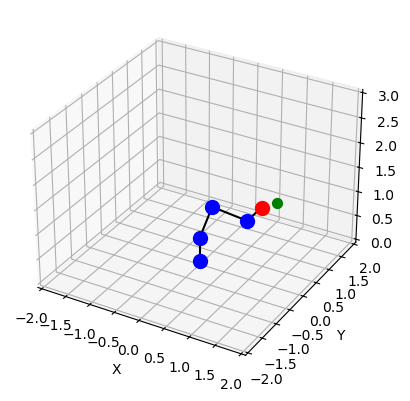

Episode 50/1000, Total Reward: 48510, Epsilon: 0.389156278534321, steps: 1306 , Done: True
Link 1 Joint Angle: 0.7999999999999997
Link 2 Joint Angle: -0.4
Link 3 Joint Angle: 1.8000000000000003
Link 4 Joint Angle: -1.2415926535897914
End Effector: (0.9520931889736072, 0.9803118572722639, 1.055697957215473)


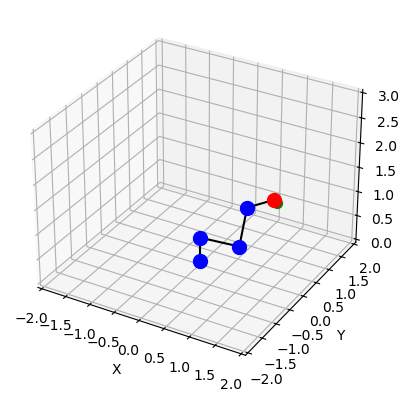

Episode 51/1000, Total Reward: -1013984, Epsilon: 0.3872104971416494, steps: 5000 , Done: False
Link 1 Joint Angle: -1.941592653589792
Link 2 Joint Angle: -2.7415926535897928
Link 3 Joint Angle: -1.3415926535897915
Link 4 Joint Angle: -0.9415926535897913
End Effector: (0.3819190051817534, 0.9823535886991205, 1.3110634861535089)


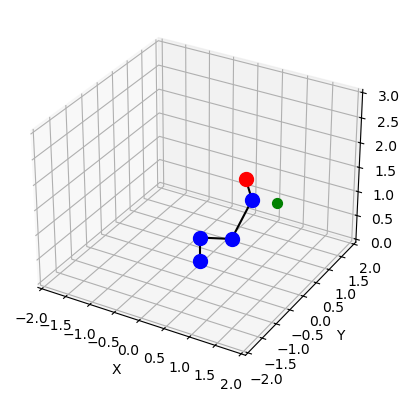

Episode 52/1000, Total Reward: -263368, Epsilon: 0.38527444465594113, steps: 5000 , Done: False
Link 1 Joint Angle: -1.4000000000000004
Link 2 Joint Angle: 2.200000000000001
Link 3 Joint Angle: 0.7415926535897913
Link 4 Joint Angle: 2.3415926535897924
End Effector: (-0.16736715604953661, 0.970375308566294, 0.8849970952877726)


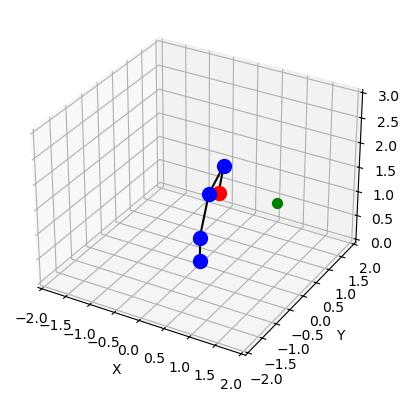

Episode 53/1000, Total Reward: -847668, Epsilon: 0.38334807243266145, steps: 5000 , Done: False
Link 1 Joint Angle: 1.0415926535897915
Link 2 Joint Angle: -0.7584073464102085
Link 3 Joint Angle: 1.6415926535897918
Link 4 Joint Angle: 0.6584073464102085
End Effector: (0.556895690157441, 0.9522061705741165, 1.0677854642183608)


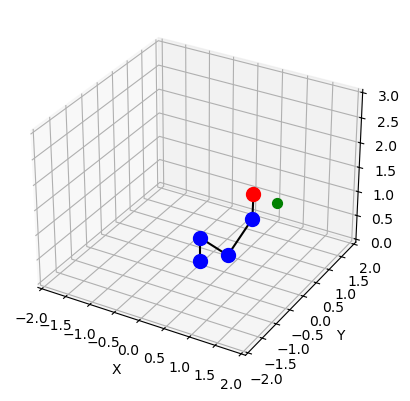

Episode 54/1000, Total Reward: 49178, Epsilon: 0.3814313320704981, steps: 700 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: -0.4
Link 3 Joint Angle: 1.8000000000000003
Link 4 Joint Angle: -1.4
End Effector: (0.9564546531271392, 0.9848025889299338, 0.976825110143848)


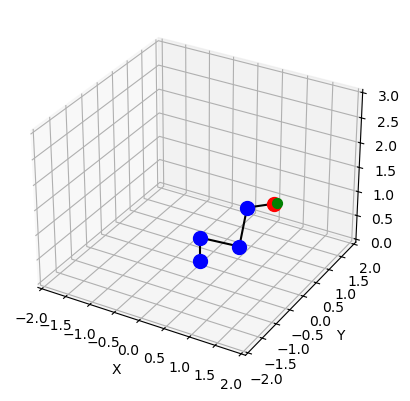

Episode 55/1000, Total Reward: -5616, Epsilon: 0.3795241754101456, steps: 5000 , Done: False
Link 1 Joint Angle: 1.0584073464102084
Link 2 Joint Angle: -3.141592653589793
Link 3 Joint Angle: -3.041592653589793
Link 4 Joint Angle: -3.041592653589793
End Effector: (-0.24220353233776917, -0.4305845411046857, 0.48053206791993186)


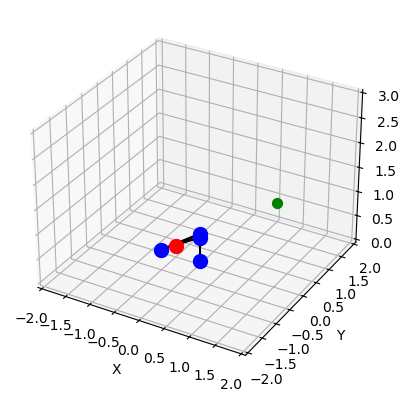

Episode 56/1000, Total Reward: -435328, Epsilon: 0.37762655453309485, steps: 4691 , Done: True
Link 1 Joint Angle: -2.3584073464102095
Link 2 Joint Angle: 1.9000000000000004
Link 3 Joint Angle: 1.0415926535897913
Link 4 Joint Angle: 1.0415926535897913
End Effector: (0.9750041227192604, 0.97069855542208, 1.0431229286976231)


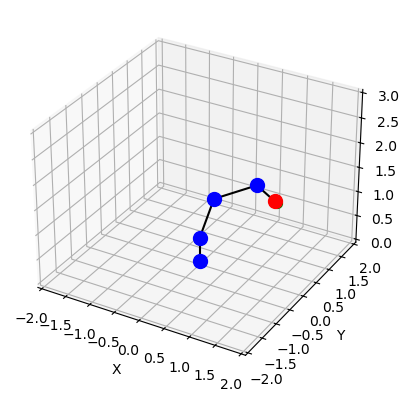

Episode 57/1000, Total Reward: -142780, Epsilon: 0.3757384217604294, steps: 730 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: 0.7999999999999999
Link 3 Joint Angle: -1.6
Link 4 Joint Angle: 1.8000000000000005
End Effector: (0.9648565029460077, 0.9934534574539874, 0.9207354924039483)


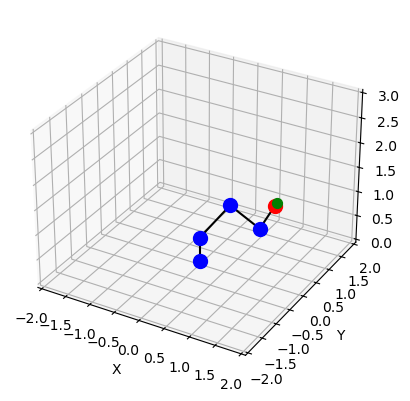

Episode 58/1000, Total Reward: -703492, Epsilon: 0.3738597296516272, steps: 5000 , Done: False
Link 1 Joint Angle: -1.0415926535897913
Link 2 Joint Angle: -3.041592653589793
Link 3 Joint Angle: -1.941592653589792
Link 4 Joint Angle: -1.0415926535897913
End Effector: (-0.04978043749911582, 0.08511690896213674, 1.3187503660297086)


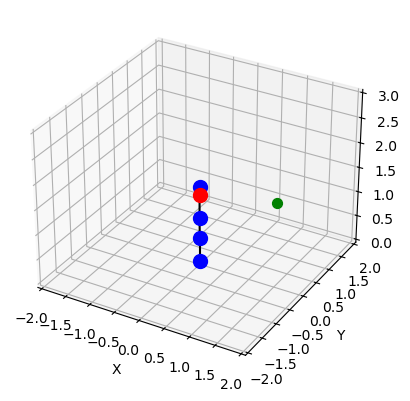

Episode 59/1000, Total Reward: 48280, Epsilon: 0.3719904310033691, steps: 1486 , Done: True
Link 1 Joint Angle: 0.7999999999999997
Link 2 Joint Angle: -2.7755575615628914e-17
Link 3 Joint Angle: 1.4
Link 4 Joint Angle: -1.941592653589792
End Effector: (0.950599238357603, 0.9787736281156968, 1.0306090980800364)


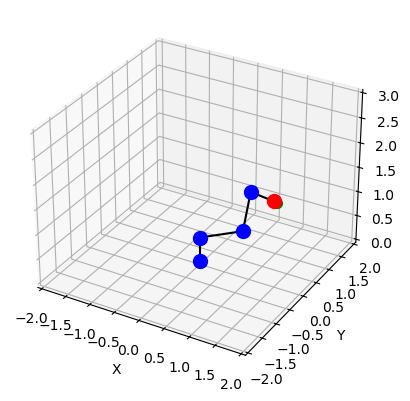

Episode 60/1000, Total Reward: -1049756, Epsilon: 0.37013047884835226, steps: 5000 , Done: False
Link 1 Joint Angle: 0.7415926535897913
Link 2 Joint Angle: -0.6
Link 3 Joint Angle: 1.7415926535897919
Link 4 Joint Angle: 0.14159265358979162
End Effector: (0.8369544425758417, 0.766662229205112, 1.2551861000760853)


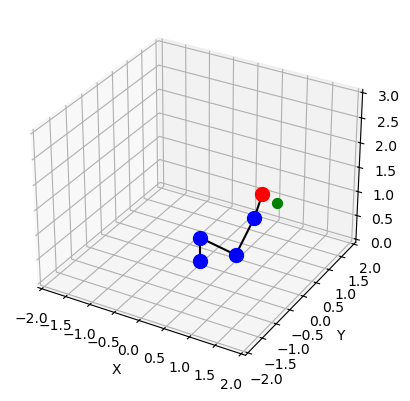

Episode 61/1000, Total Reward: -497908, Epsilon: 0.3682798264541105, steps: 5000 , Done: False
Link 1 Joint Angle: -1.8000000000000007
Link 2 Joint Angle: -2.1415926535897922
Link 3 Joint Angle: -2.941592653589793
Link 4 Joint Angle: -1.941592653589792
End Effector: (-0.05142519853995473, -0.2204218576119463, 0.23472289065188923)


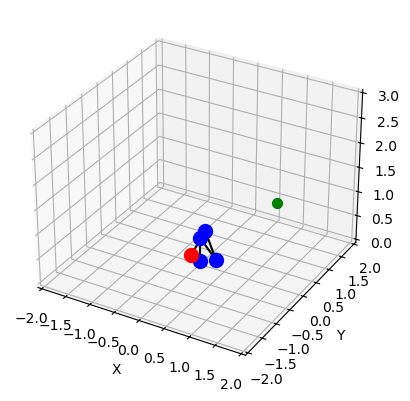

Episode 62/1000, Total Reward: -243430, Epsilon: 0.36643842732183995, steps: 5000 , Done: False
Link 1 Joint Angle: -1.2415926535897914
Link 2 Joint Angle: 0.5999999999999998
Link 3 Joint Angle: 2.800000000000001
Link 4 Joint Angle: -0.6584073464102086
End Effector: (-0.1854714052728382, 0.5428928894179155, 0.9419902682488881)


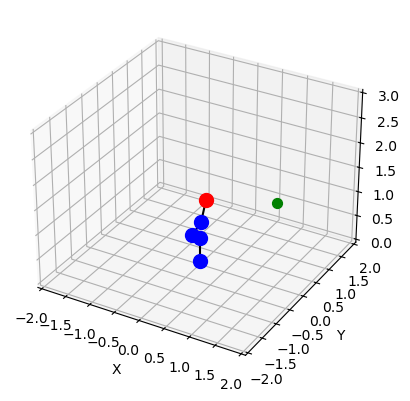

Episode 63/1000, Total Reward: -965684, Epsilon: 0.3646062351852308, steps: 5000 , Done: False
Link 1 Joint Angle: -2.7415926535897928
Link 2 Joint Angle: -2.7415926535897928
Link 3 Joint Angle: -1.4415926535897916
Link 4 Joint Angle: -0.5415926535897914
End Effector: (1.044972570334103, 0.44180731650464616, 1.3789944482542282)


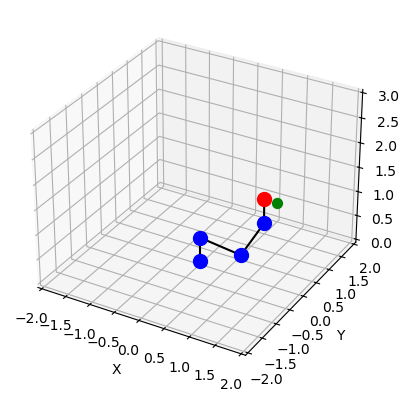

Episode 64/1000, Total Reward: -5788, Epsilon: 0.36278320400930464, steps: 5000 , Done: False
Link 1 Joint Angle: -0.9999999999999999
Link 2 Joint Angle: 0.7999999999999999
Link 3 Joint Angle: 2.4415926535897925
Link 4 Joint Angle: -0.8415926535897913
End Effector: (-0.3281444050390402, 0.5110546312100881, 1.3317497296777314)


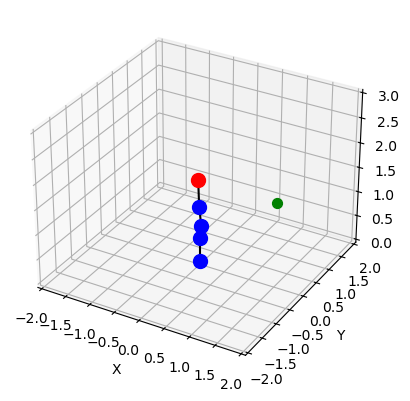

Episode 65/1000, Total Reward: -395442, Epsilon: 0.3609692879892581, steps: 5000 , Done: False
Link 1 Joint Angle: 0.041592653589791334
Link 2 Joint Angle: 0.5999999999999998
Link 3 Joint Angle: -0.05840734641020867
Link 4 Joint Angle: 0.9415926535897913
End Effector: (1.3883272525785184, 0.05777753572238256, 1.862197380591118)


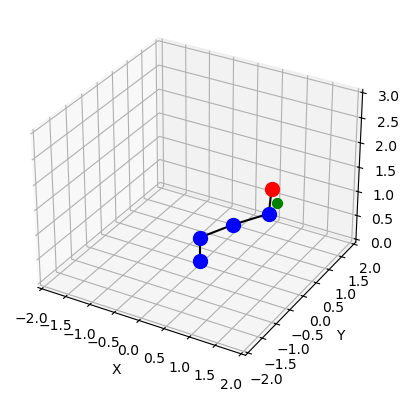

Episode 66/1000, Total Reward: -287392, Epsilon: 0.3591644415493118, steps: 5000 , Done: False
Link 1 Joint Angle: -1.7415926535897919
Link 2 Joint Angle: 2.2415926535897923
Link 3 Joint Angle: 1.0415926535897913
Link 4 Joint Angle: -0.4415926535897914
End Effector: (0.3003234799386135, 1.7412406137132537, 1.161525624584766)


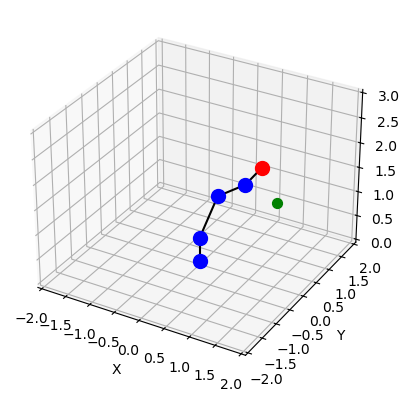

Episode 67/1000, Total Reward: -1848044, Epsilon: 0.3573686193415653, steps: 5000 , Done: False
Link 1 Joint Angle: -2.6415926535897927
Link 2 Joint Angle: -1.3415926535897915
Link 3 Joint Angle: -2.4415926535897925
Link 4 Joint Angle: -3.141592653589793
End Effector: (0.05141002291004274, 0.0280854235186827, -0.09953646147136963)


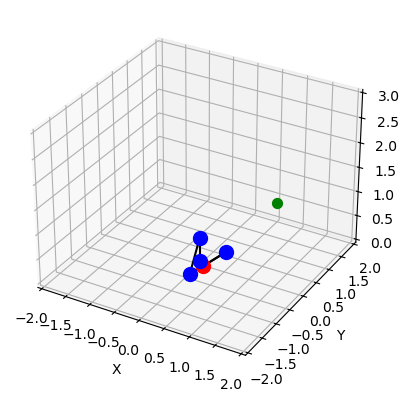

Episode 68/1000, Total Reward: -376046, Epsilon: 0.35558177624485743, steps: 5000 , Done: False
Link 1 Joint Angle: 2.4415926535897925
Link 2 Joint Angle: -0.9415926535897913
Link 3 Joint Angle: 2.5415926535897926
Link 4 Joint Angle: 0.35840734641020877
End Effector: (-0.19767530244836512, 0.1664996103567831, 1.1157691005413983)


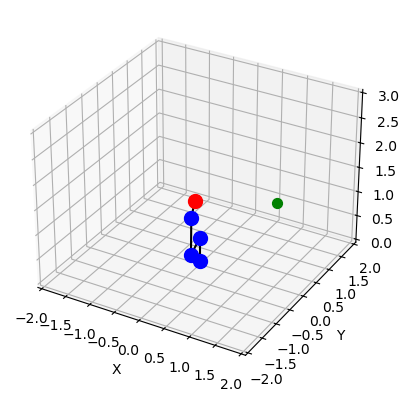

Episode 69/1000, Total Reward: -5916, Epsilon: 0.3538038673636331, steps: 5000 , Done: False
Link 1 Joint Angle: -0.7415926535897913
Link 2 Joint Angle: -0.40000000000000024
Link 3 Joint Angle: 3.141592653589793
Link 4 Joint Angle: -1.2
End Effector: (0.010765772120888636, -0.009861601102101573, 0.9997868015207527)


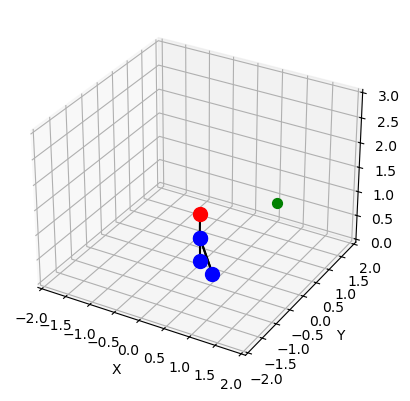

Episode 70/1000, Total Reward: -457714, Epsilon: 0.35203484802681495, steps: 5000 , Done: False
Link 1 Joint Angle: 1.941592653589792
Link 2 Joint Angle: -1.8000000000000003
Link 3 Joint Angle: 2.3415926535897924
Link 4 Joint Angle: 1.0415926535897913
End Effector: (-0.18029291079267337, 0.4637407029532522, 0.633284621536665)


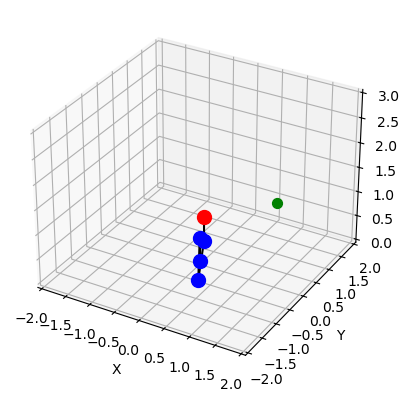

Episode 71/1000, Total Reward: -6112, Epsilon: 0.35027467378668087, steps: 5000 , Done: False
Link 1 Joint Angle: -1.3415926535897915
Link 2 Joint Angle: -2.7415926535897928
Link 3 Joint Angle: -2.1415926535897922
Link 4 Joint Angle: -1.6415926535897918
End Effector: (-0.026218212534623413, 0.11237811956440857, 0.8572004455368577)


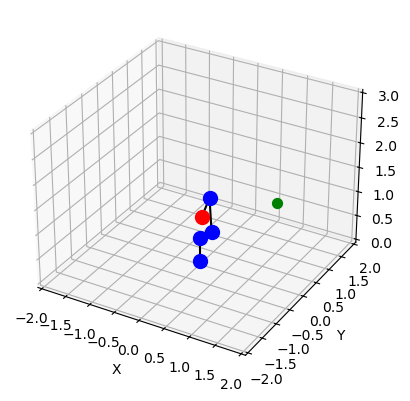

Episode 72/1000, Total Reward: -2029630, Epsilon: 0.3485233004177475, steps: 5000 , Done: False
Link 1 Joint Angle: -2.5415926535897926
Link 2 Joint Angle: -1.841592653589792
Link 3 Joint Angle: -2.2415926535897923
Link 4 Joint Angle: -3.041592653589793
End Effector: (0.29023912849509337, 0.1985632710245078, 0.0030979686335573797)


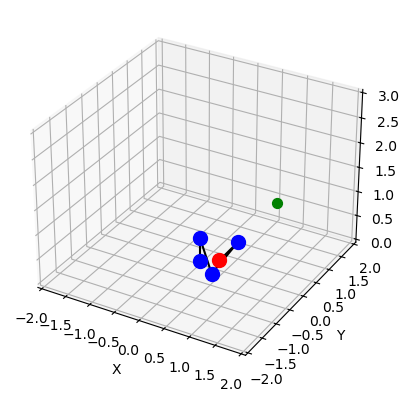

Episode 73/1000, Total Reward: -37576, Epsilon: 0.34678068391565875, steps: 5000 , Done: False
Link 1 Joint Angle: -0.2584073464102088
Link 2 Joint Angle: 2.841592653589793
Link 3 Joint Angle: -2.5415926535897926
Link 4 Joint Angle: 1.3415926535897915
End Effector: (-0.03419429936023118, 0.009038131234229361, 1.471579823960171)


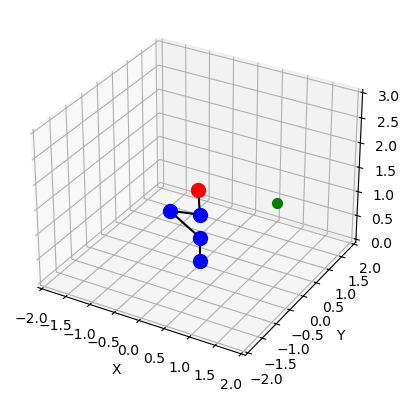

Episode 74/1000, Total Reward: -1441628, Epsilon: 0.34504678049608045, steps: 5000 , Done: False
Link 1 Joint Angle: -1.841592653589792
Link 2 Joint Angle: -2.941592653589793
Link 3 Joint Angle: -1.3415926535897915
Link 4 Joint Angle: 0.35840734641020866
End Effector: (0.3935725295393431, 1.417688572106624, 1.4212726396096902)


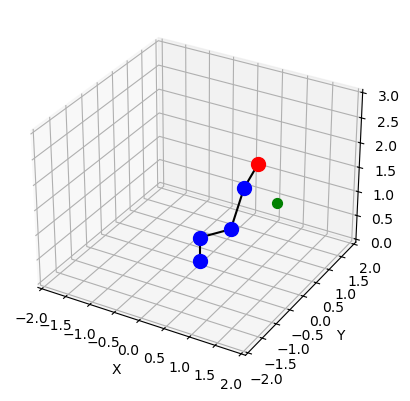

Episode 75/1000, Total Reward: -407742, Epsilon: 0.34332154659360004, steps: 5000 , Done: False
Link 1 Joint Angle: -0.2415926535897914
Link 2 Joint Angle: -0.05840734641020873
Link 3 Joint Angle: 1.6415926535897918
Link 4 Joint Angle: 2.941592653589793
End Effector: (0.6752710178754866, -0.16639042119745862, 0.7620129849970494)


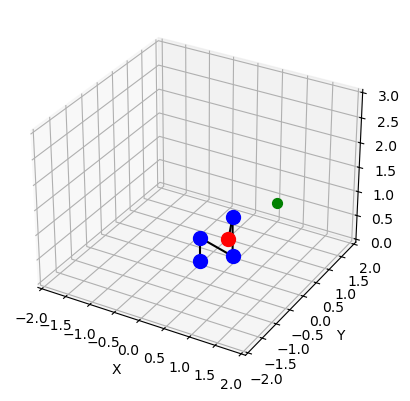

Episode 76/1000, Total Reward: -961522, Epsilon: 0.34160493886063203, steps: 5000 , Done: False
Link 1 Joint Angle: -1.9584073464102092
Link 2 Joint Angle: 3.041592653589793
Link 3 Joint Angle: -0.8584073464102087
Link 4 Joint Angle: 3.041592653589793
End Effector: (0.3820342296243682, 0.9357505984329363, 0.7987005359621975)


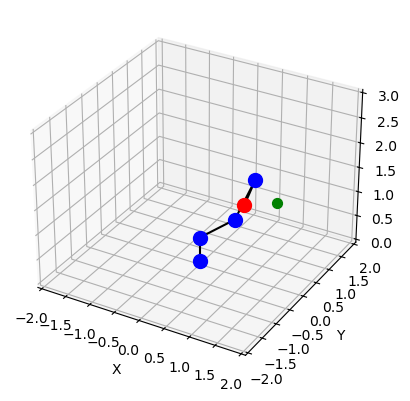

Episode 77/1000, Total Reward: 49594, Epsilon: 0.3398969141663289, steps: 318 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: -0.7999999999999999
Link 3 Joint Angle: 1.6
Link 4 Joint Angle: 0.20000000000000004
End Effector: (0.9648565029460077, 0.9934534574539874, 0.9207354924039484)


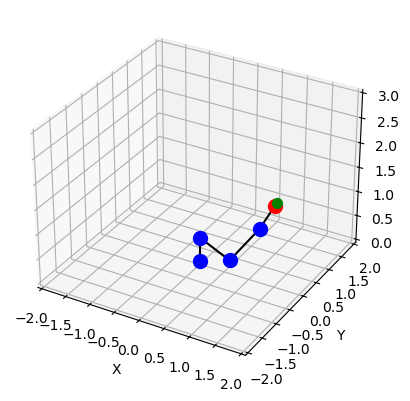

Episode 78/1000, Total Reward: -619902, Epsilon: 0.33819742959549726, steps: 5000 , Done: False
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: -1.5415926535897917
Link 3 Joint Angle: -2.841592653589793
Link 4 Joint Angle: -2.941592653589793
End Effector: (-0.011949228372289686, -0.012303386259109643, 0.025776504392290678)


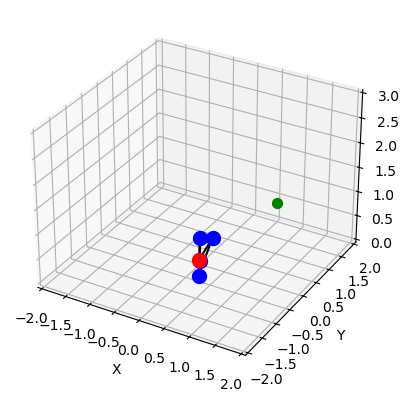

Episode 79/1000, Total Reward: -108786, Epsilon: 0.33650644244751976, steps: 4451 , Done: True
Link 1 Joint Angle: -2.3584073464102095
Link 2 Joint Angle: 2.700000000000001
Link 3 Joint Angle: 0.8415926535897913
Link 4 Joint Angle: -2.1415926535897922
End Effector: (0.974508061645785, 0.9702046849284036, 1.0230940953343735)


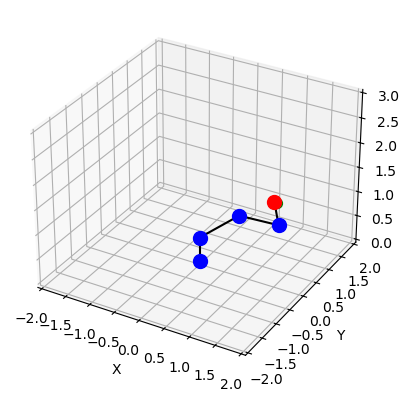

Episode 80/1000, Total Reward: -1073510, Epsilon: 0.3348239102352822, steps: 5000 , Done: False
Link 1 Joint Angle: -1.841592653589792
Link 2 Joint Angle: -2.7415926535897928
Link 3 Joint Angle: -1.7415926535897919
Link 4 Joint Angle: -2.941592653589793
End Effector: (0.19006782928712374, 0.6846437931551115, 0.5128947174427948)


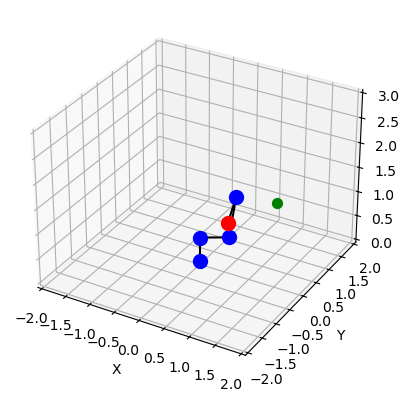

Episode 81/1000, Total Reward: -5694, Epsilon: 0.3331497906841058, steps: 5000 , Done: False
Link 1 Joint Angle: 2.941592653589793
Link 2 Joint Angle: 1.5415926535897917
Link 3 Joint Angle: 2.1415926535897922
Link 4 Joint Angle: 1.7415926535897919
End Effector: (0.3286453084530452, -0.06661970214627552, 0.5088565373220693)


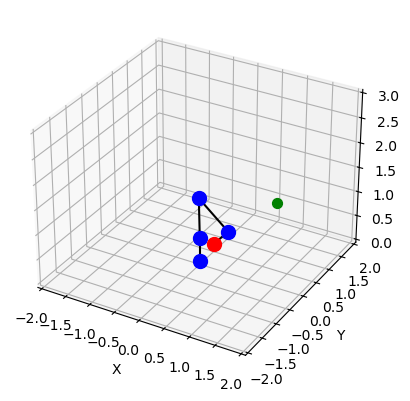

Episode 82/1000, Total Reward: -153878, Epsilon: 0.33148404173068524, steps: 3306 , Done: True
Link 1 Joint Angle: 0.8415926535897913
Link 2 Joint Angle: 0.5415926535897914
Link 3 Joint Angle: -1.0584073464102084
Link 4 Joint Angle: 1.941592653589792
End Effector: (0.9686180958550741, 1.084090586511534, 1.0117895398579715)


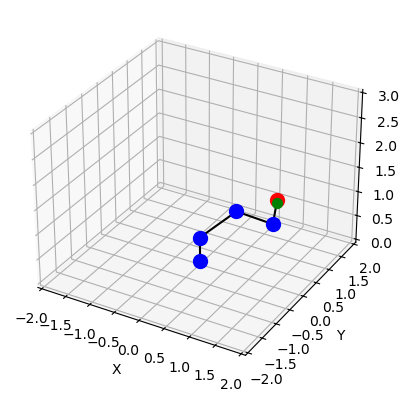

Episode 83/1000, Total Reward: 49522, Epsilon: 0.3298266215220318, steps: 473 , Done: True
Link 1 Joint Angle: 0.7415926535897913
Link 2 Joint Angle: 0.6999999999999997
Link 3 Joint Angle: -1.3
Link 4 Joint Angle: 1.7415926535897919
End Effector: (1.0915017253510535, 0.9998311776247435, 1.0183088844869648)


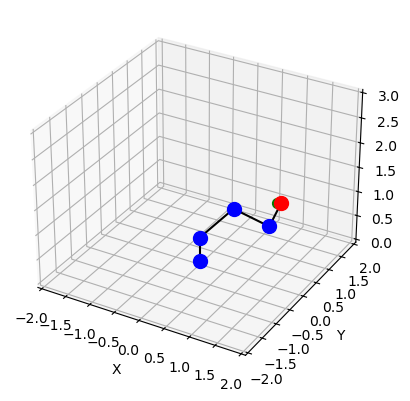

Episode 84/1000, Total Reward: 49518, Epsilon: 0.3281774884144216, steps: 416 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: 1.2
Link 3 Joint Angle: -1.2
Link 4 Joint Angle: -0.6
End Effector: (1.0468394606454003, 1.077866271722311, 0.9633100320762633)


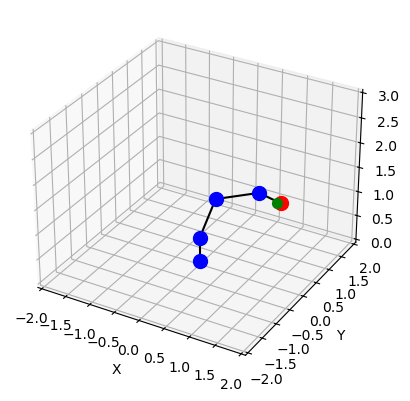

Episode 85/1000, Total Reward: -355578, Epsilon: 0.3265366009723495, steps: 5000 , Done: False
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: 2.0000000000000004
Link 3 Joint Angle: 2.041592653589792
Link 4 Joint Angle: 2.6415926535897927
End Effector: (0.25755501574990464, 0.26518857477781604, 0.7954855849128832)


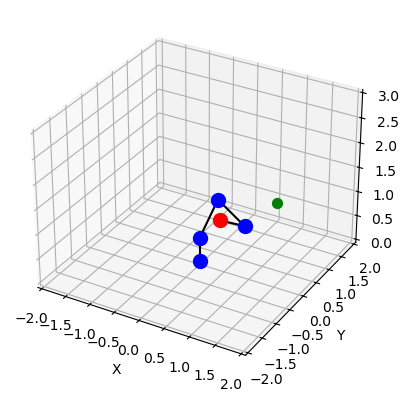

Episode 86/1000, Total Reward: 49378, Epsilon: 0.32490391796748774, steps: 518 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: -0.6
Link 3 Joint Angle: 1.8000000000000003
Link 4 Joint Angle: -0.7999999999999999
End Effector: (0.9828338383987798, 1.01196361518919, 0.9886264612120783)


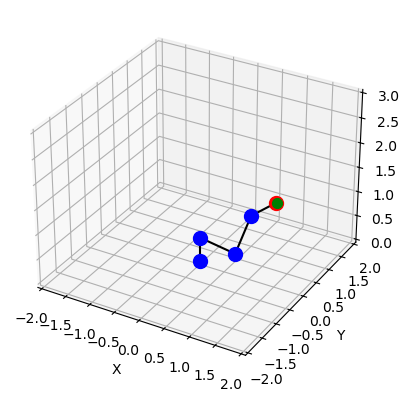

Episode 87/1000, Total Reward: -12426, Epsilon: 0.3232793983776503, steps: 5000 , Done: False
Link 1 Joint Angle: 3.141592653589793
Link 2 Joint Angle: 2.941592653589793
Link 3 Joint Angle: 3.141592653589793
Link 4 Joint Angle: 2.3415926535897924
End Effector: (0.2701511529340697, -3.3083974472667555e-17, 0.9207354924039483)


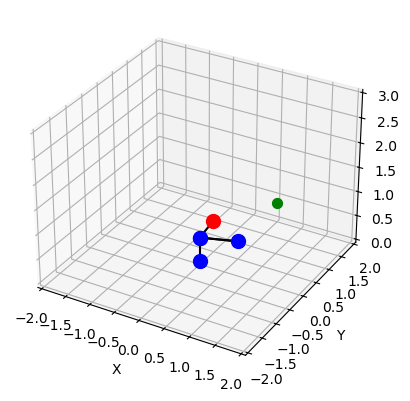

Episode 88/1000, Total Reward: -227818, Epsilon: 0.32166300138576204, steps: 5000 , Done: False
Link 1 Joint Angle: 1.8000000000000003
Link 2 Joint Angle: 2.041592653589792
Link 3 Joint Angle: -2.941592653589793
Link 4 Joint Angle: -1.3415926535897915
End Effector: (0.040077065084081244, -0.17178078810147177, 0.19464090553341962)


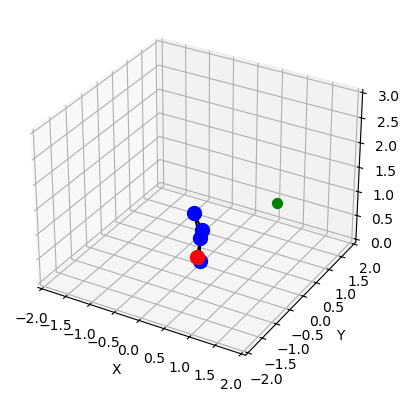

Episode 89/1000, Total Reward: -1339834, Epsilon: 0.3200546863788332, steps: 5000 , Done: False
Link 1 Joint Angle: 2.941592653589793
Link 2 Joint Angle: 0.8000000000000003
Link 3 Joint Angle: 2.941592653589793
Link 4 Joint Angle: 2.841592653589793
End Effector: (-0.36729476876320644, 0.07445433561813936, 0.7699309973342597)


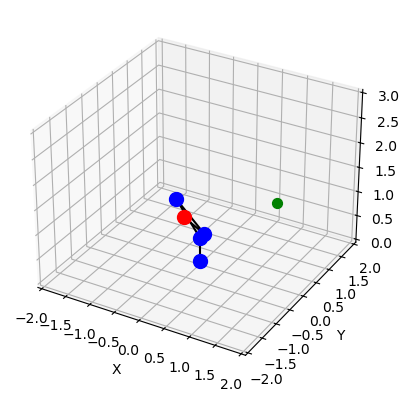

Episode 90/1000, Total Reward: 44906, Epsilon: 0.31845441294693905, steps: 4484 , Done: True
Link 1 Joint Angle: 0.8415926535897913
Link 2 Joint Angle: 1.1415926535897913
Link 3 Joint Angle: -0.9584073464102086
Link 4 Joint Angle: -1.1584073464102087
End Effector: (0.9328026527503104, 1.0440054540039299, 0.9592547103353898)


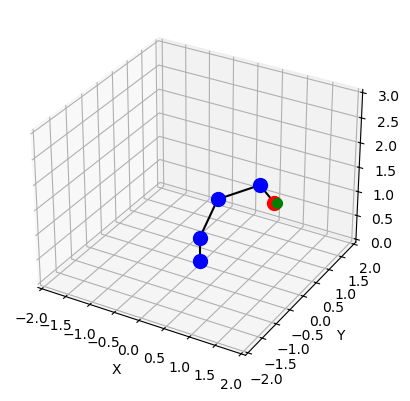

Episode 91/1000, Total Reward: -5786, Epsilon: 0.3168621408822043, steps: 5000 , Done: False
Link 1 Joint Angle: -0.9999999999999999
Link 2 Joint Angle: 1.4415926535897916
Link 3 Joint Angle: 0.8584073464102087
Link 4 Joint Angle: -0.15840734641020868
End Effector: (-0.3782636854838955, 0.5891107857290511, 2.3106315105072994)


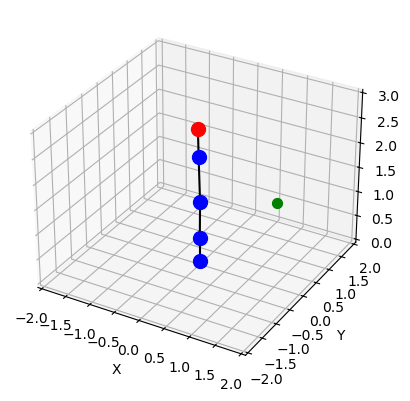

Episode 92/1000, Total Reward: -1545614, Epsilon: 0.3152778301777933, steps: 5000 , Done: False
Link 1 Joint Angle: -2.841592653589793
Link 2 Joint Angle: -1.0415926535897913
Link 3 Joint Angle: -2.7415926535897928
Link 4 Joint Angle: -2.7415926535897928
End Effector: (-0.23734482321505695, -0.07341935747760486, 0.16858555735707542)


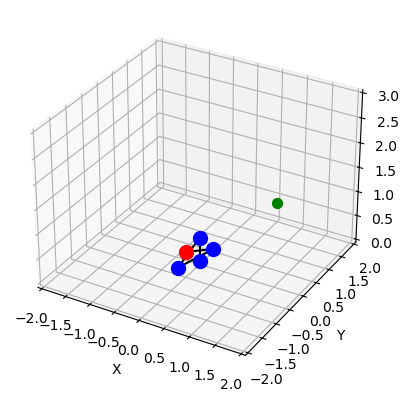

Episode 93/1000, Total Reward: -811714, Epsilon: 0.31370144102690434, steps: 5000 , Done: False
Link 1 Joint Angle: -0.14159265358979123
Link 2 Joint Angle: -0.45840734641020875
Link 3 Joint Angle: 1.8000000000000003
Link 4 Joint Angle: -2.1415926535897922
End Effector: (1.2350371852061726, -0.17605028131932396, 0.5663837046169109)


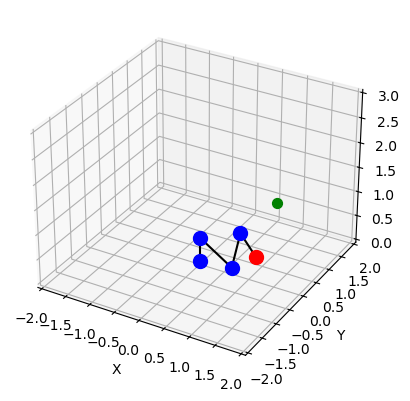

Episode 94/1000, Total Reward: -6348, Epsilon: 0.3121329338217698, steps: 5000 , Done: False
Link 1 Joint Angle: 3.041592653589793
Link 2 Joint Angle: 3.041592653589793
Link 3 Joint Angle: 2.841592653589793
Link 4 Joint Angle: 2.841592653589793
End Effector: (0.4393695917943157, -0.04408400391700102, 0.590440903089388)


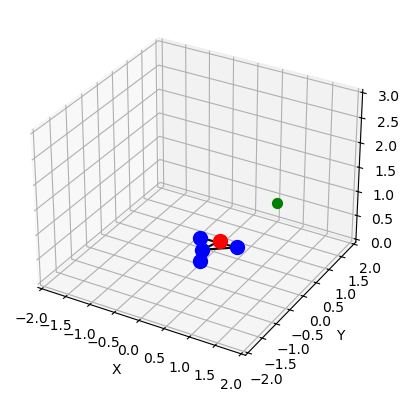

Episode 95/1000, Total Reward: -5826, Epsilon: 0.31057226915266095, steps: 5000 , Done: False
Link 1 Joint Angle: 2.841592653589793
Link 2 Joint Angle: 1.2
Link 3 Joint Angle: 0.3415926535897914
Link 4 Joint Angle: 3.141592653589793
End Effector: (-0.2853074787111851, 0.08825594545009553, 1.5455033496862327)


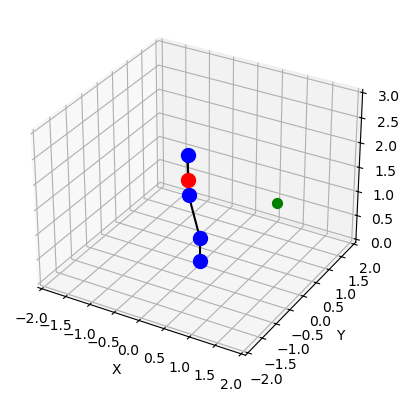

Episode 96/1000, Total Reward: -183602, Epsilon: 0.30901940780689763, steps: 5000 , Done: False
Link 1 Joint Angle: -0.6584073464102087
Link 2 Joint Angle: 0.7415926535897913
Link 3 Joint Angle: 2.3584073464102095
Link 4 Joint Angle: 2.4415926535897925
End Effector: (0.12600409098631038, -0.09747123201077083, 0.735903484111976)


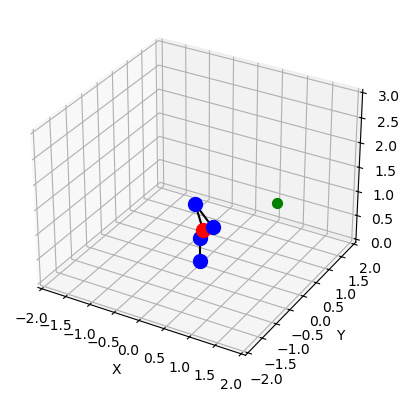

Episode 97/1000, Total Reward: -261622, Epsilon: 0.30747431076786313, steps: 5000 , Done: False
Link 1 Joint Angle: -1.6
Link 2 Joint Angle: 2.3415926535897924
Link 3 Joint Angle: -1.1415926535897913
Link 4 Joint Angle: -2.6415926535897927
End Effector: (0.005929164969032589, 0.20297033389692776, 1.323683736267166)


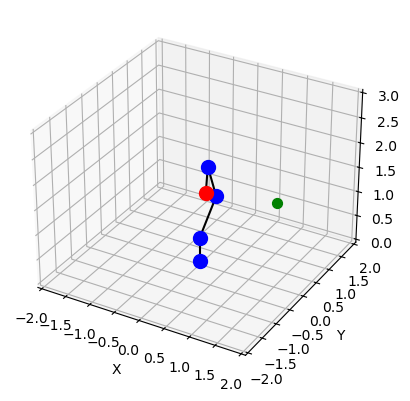

Episode 98/1000, Total Reward: -1371544, Epsilon: 0.3059369392140238, steps: 5000 , Done: False
Link 1 Joint Angle: 0.1415926535897914
Link 2 Joint Angle: 0.20000000000000037
Link 3 Joint Angle: 0.6415926535897913
Link 4 Joint Angle: 2.3415926535897924
End Effector: (0.8093253050406726, 0.11536652445608174, 1.2347093031607808)


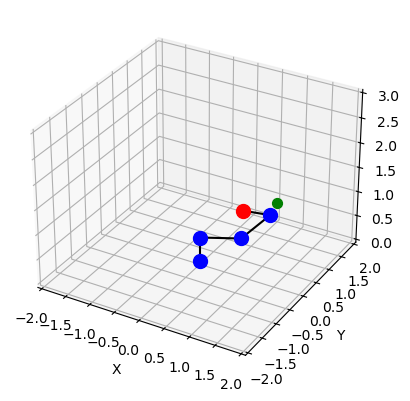

Episode 99/1000, Total Reward: -728148, Epsilon: 0.3044072545179537, steps: 1922 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: 1.1999999999999997
Link 3 Joint Angle: -1.6415926535897918
Link 4 Joint Angle: 0.6000000000000003
End Effector: (1.049856055164068, 1.080972273749718, 0.9826002116583428)


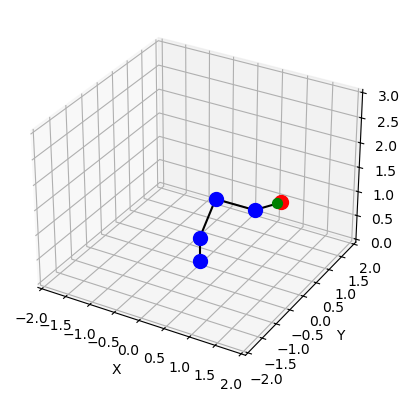

Episode 100/1000, Total Reward: -5868, Epsilon: 0.3028852182453639, steps: 5000 , Done: False
Link 1 Joint Angle: -0.2584073464102088
Link 2 Joint Angle: -0.9584073464102086
Link 3 Joint Angle: 3.141592653589793
Link 4 Joint Angle: -1.8000000000000007
End Effector: (0.44834223524988476, -0.11850443014922463, 0.686938332415117)


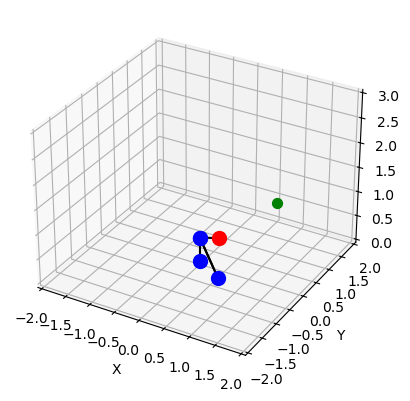

Episode 101/1000, Total Reward: 26936, Epsilon: 0.3013707921541371, steps: 946 , Done: True
Link 1 Joint Angle: 0.7999999999999997
Link 2 Joint Angle: 1.4000000000000001
Link 3 Joint Angle: -1.8000000000000003
Link 4 Joint Angle: 0.6
End Effector: (0.9495107786480111, 0.9776529080309053, 1.076159775541378)


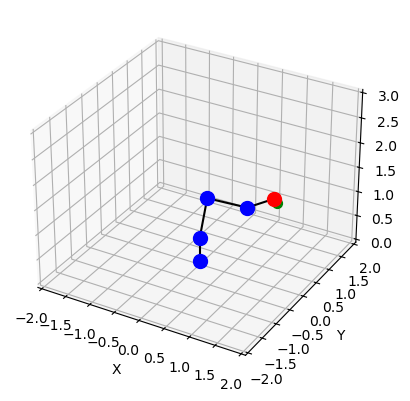

Episode 102/1000, Total Reward: -735614, Epsilon: 0.29986393819336643, steps: 5000 , Done: False
Link 1 Joint Angle: -2.2415926535897923
Link 2 Joint Angle: -1.7415926535897919
Link 3 Joint Angle: -2.4415926535897925
Link 4 Joint Angle: -2.6415926535897927
End Effector: (0.06925121769714761, 0.08726749105642818, 0.1444570234175987)


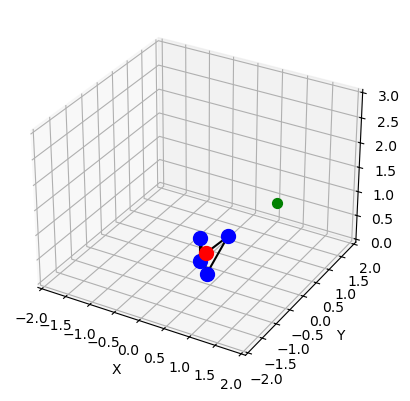

Episode 103/1000, Total Reward: 49106, Epsilon: 0.2983646185023996, steps: 810 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: 1.4000000000000001
Link 3 Joint Angle: -1.6000000000000003
Link 4 Joint Angle: 1.942890293094024e-16
End Effector: (0.9823984475673148, 1.0115153200017275, 1.0300896539571882)


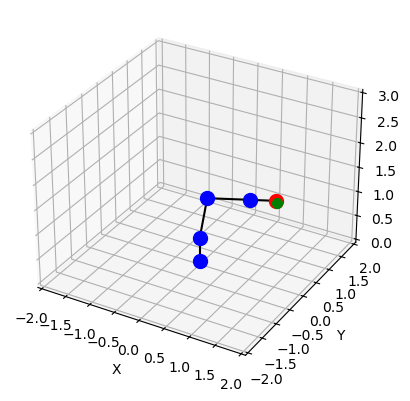

Episode 104/1000, Total Reward: -51776, Epsilon: 0.2968727954098876, steps: 5000 , Done: False
Link 1 Joint Angle: -2.5415926535897926
Link 2 Joint Angle: 0.9999999999999997
Link 3 Joint Angle: 2.941592653589793
Link 4 Joint Angle: -2.7415926535897928
End Effector: (-0.04626448043819321, -0.03165123398657221, 1.0653114581103127)


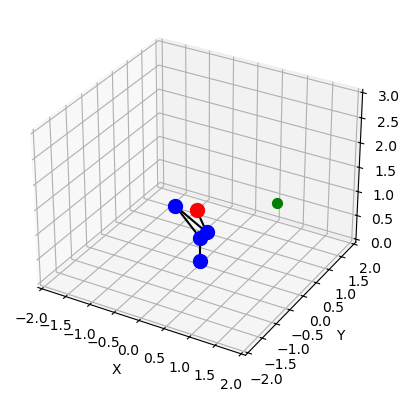

Episode 105/1000, Total Reward: -435728, Epsilon: 0.29538843143283816, steps: 5000 , Done: False
Link 1 Joint Angle: 3.141592653589793
Link 2 Joint Angle: 0.7999999999999998
Link 3 Joint Angle: 3.141592653589793
Link 4 Joint Angle: 2.3415926535897924
End Effector: (-0.5, 6.123233995736766e-17, 0.49999999999999933)


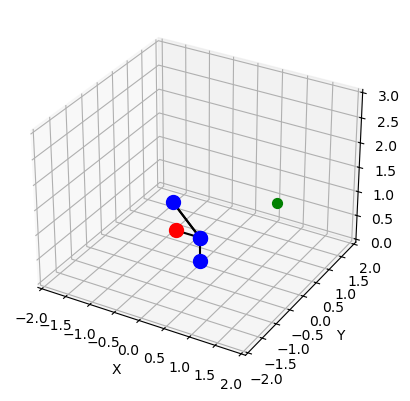

Episode 106/1000, Total Reward: -5726, Epsilon: 0.29391148927567395, steps: 5000 , Done: False
Link 1 Joint Angle: -1.1415926535897913
Link 2 Joint Angle: 2.2415926535897923
Link 3 Joint Angle: -1.0000000000000002
Link 4 Joint Angle: -0.9584073464102084
End Effector: (0.10046984060960656, -0.21953060678752023, 2.0234093469513805)


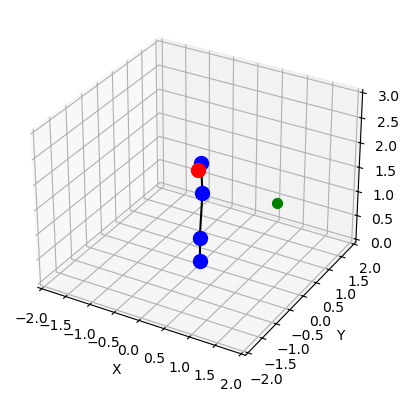

Episode 107/1000, Total Reward: -5948, Epsilon: 0.29244193182929556, steps: 5000 , Done: False
Link 1 Joint Angle: 0.4
Link 2 Joint Angle: 1.5415926535897917
Link 3 Joint Angle: -2.0000000000000004
Link 4 Joint Angle: -2.041592653589792
End Effector: (0.3133399240541718, 0.1324779950500345, 0.646406455745343)


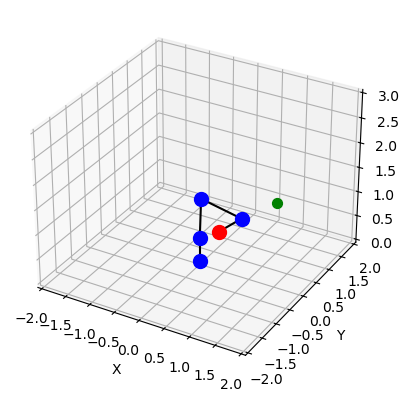

Episode 108/1000, Total Reward: -12054, Epsilon: 0.2909797221701491, steps: 5000 , Done: False
Link 1 Joint Angle: 0.7415926535897913
Link 2 Joint Angle: -0.35840734641020855
Link 3 Joint Angle: 1.4415926535897916
Link 4 Joint Angle: 1.7415926535897919
End Effector: (0.4784670492960651, 0.4382826542930661, 1.0819078241811155)


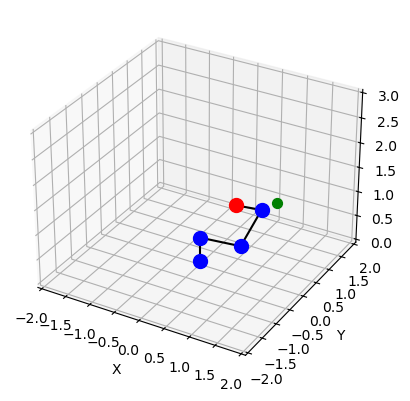

Episode 109/1000, Total Reward: 49496, Epsilon: 0.28952482355929837, steps: 420 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: -0.20000000000000004
Link 3 Joint Angle: 1.6000000000000003
Link 4 Joint Angle: -1.6
End Effector: (0.9823984475673146, 1.0115153200017273, 1.0300896539571889)


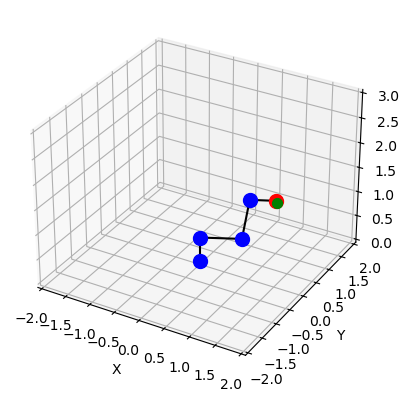

Episode 110/1000, Total Reward: -332636, Epsilon: 0.2880771994415019, steps: 5000 , Done: False
Link 1 Joint Angle: 0.041592653589791334
Link 2 Joint Angle: 0.14159265358979123
Link 3 Joint Angle: 1.0415926535897913
Link 4 Joint Angle: 2.4415926535897925
End Effector: (0.6510528826860942, 0.027094642935728525, 1.1212466626032003)


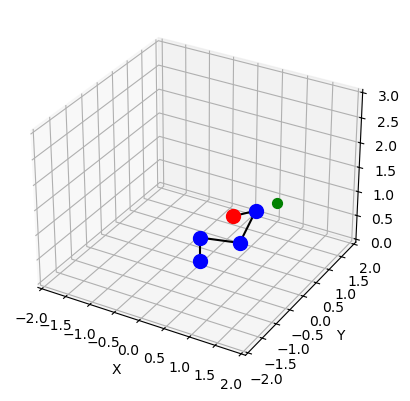

Episode 111/1000, Total Reward: -1215410, Epsilon: 0.28663681344429437, steps: 5000 , Done: False
Link 1 Joint Angle: -1.7415926535897919
Link 2 Joint Angle: -2.041592653589792
Link 3 Joint Angle: -2.6415926535897927
Link 4 Joint Angle: -0.34159265358979163
End Effector: (0.0395292720203689, 0.22918612253179213, 1.0624940313288138)


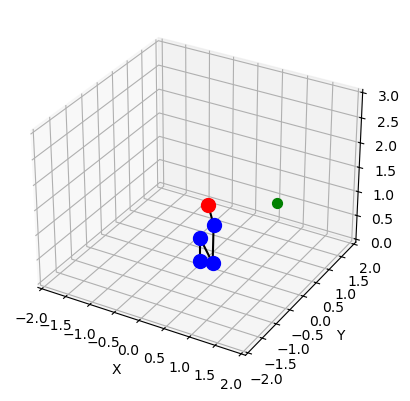

Episode 112/1000, Total Reward: -635298, Epsilon: 0.2852036293770729, steps: 5000 , Done: False
Link 1 Joint Angle: -3.041592653589793
Link 2 Joint Angle: 1.1415926535897913
Link 3 Joint Angle: 2.841592653589793
Link 4 Joint Angle: -2.041592653589792
End Effector: (0.3793774020458327, 0.03806470723089884, 1.096893314702783)


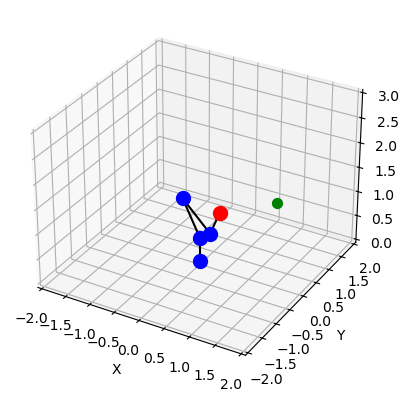

Episode 113/1000, Total Reward: -352290, Epsilon: 0.2837776112301875, steps: 5000 , Done: False
Link 1 Joint Angle: 1.6415926535897918
Link 2 Joint Angle: -0.2584073464102087
Link 3 Joint Angle: 1.5415926535897917
Link 4 Joint Angle: 1.5415926535897917
End Effector: (-0.03715485710696425, 0.5239362431424714, 1.218477219865735)


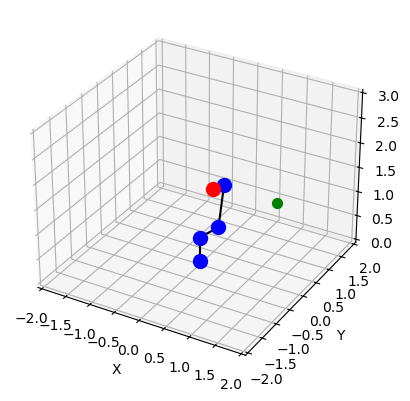

Episode 114/1000, Total Reward: -930142, Epsilon: 0.2823587231740366, steps: 5000 , Done: False
Link 1 Joint Angle: 2.600000000000001
Link 2 Joint Angle: -1.6415926535897918
Link 3 Joint Angle: 3.141592653589793
Link 4 Joint Angle: -0.7415926535897913
End Effector: (-0.31102161358815206, 0.18710954933234353, 0.843883079591988)


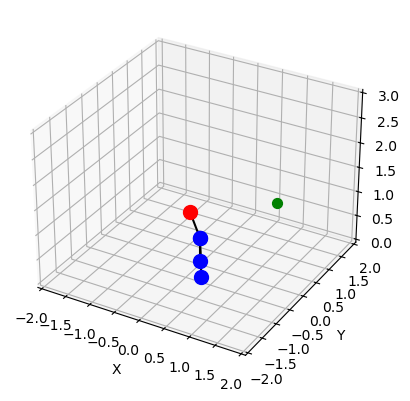

Episode 115/1000, Total Reward: 10528, Epsilon: 0.2809469295581664, steps: 1268 , Done: True
Link 1 Joint Angle: -2.400000000000001
Link 2 Joint Angle: 1.8000000000000003
Link 3 Joint Angle: 1.5415926535897917
Link 4 Joint Angle: 2.7755575615628914e-17
End Effector: (1.0735333333333832, 0.983371873774106, 1.0208079746689782)


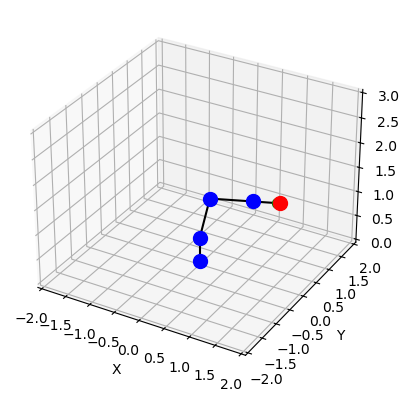

Episode 116/1000, Total Reward: 49354, Epsilon: 0.2795421949103756, steps: 624 , Done: True
Link 1 Joint Angle: 0.7999999999999997
Link 2 Joint Angle: 2.7755575615628914e-17
Link 3 Joint Angle: -2.7755575615628914e-17
Link 4 Joint Angle: 1.8000000000000003
End Effector: (1.0355841230802632, 1.0662773421926282, 0.9869238154390976)


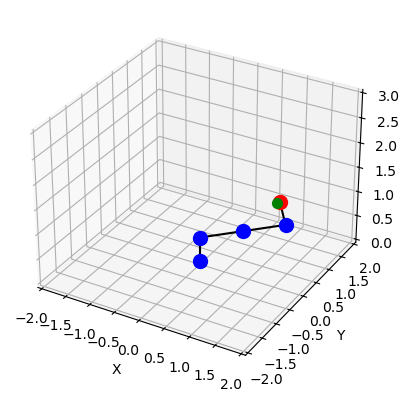

Episode 117/1000, Total Reward: -151850, Epsilon: 0.2781444839358237, steps: 1648 , Done: True
Link 1 Joint Angle: 0.7999999999999999
Link 2 Joint Angle: -0.6
Link 3 Joint Angle: 1.8000000000000003
Link 4 Joint Angle: -0.7999999999999997
End Effector: (0.9828338383987798, 1.01196361518919, 0.9886264612120783)


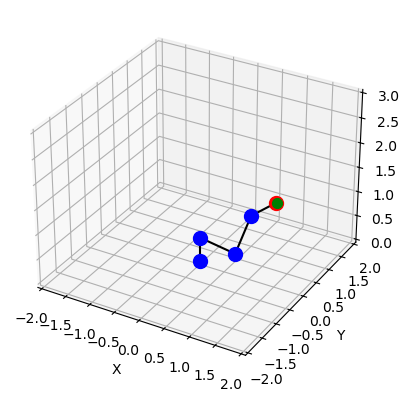

Episode 118/1000, Total Reward: -225608, Epsilon: 0.27675376151614456, steps: 5000 , Done: False
Link 1 Joint Angle: 0.5999999999999998
Link 2 Joint Angle: 2.3415926535897924
Link 3 Joint Angle: -2.3415926535897924
Link 4 Joint Angle: -0.5415926535897914
End Effector: (0.5538654067166243, 0.3789197116019845, 0.8161341868088876)


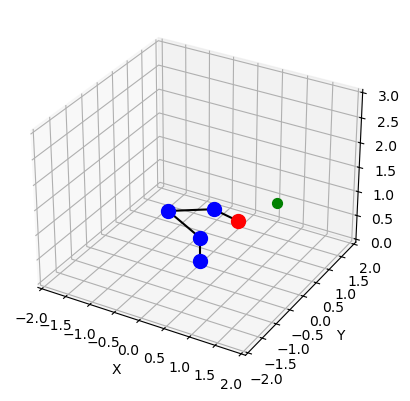

Episode 119/1000, Total Reward: 49176, Epsilon: 0.2753699927085638, steps: 673 , Done: True
Link 1 Joint Angle: 0.7415926535897913
Link 2 Joint Angle: -0.7
Link 3 Joint Angle: 1.5
Link 4 Joint Angle: 0.1415926535897914
End Effector: (1.0791680897924876, 0.988533391209473, 0.9627589248392601)


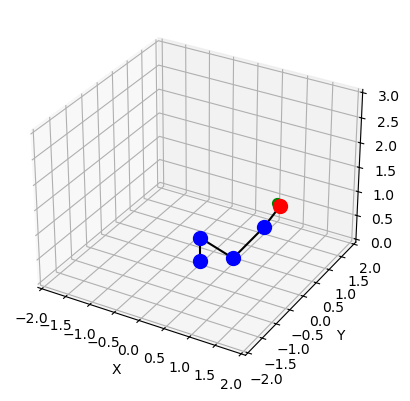

Episode 120/1000, Total Reward: -620726, Epsilon: 0.273993142745021, steps: 4067 , Done: True
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: 1.9000000000000004
Link 3 Joint Angle: 1.841592653589792
Link 4 Joint Angle: -0.8584073464102087
End Effector: (0.9769912902105976, 1.005947902303215, 0.9330966424473209)


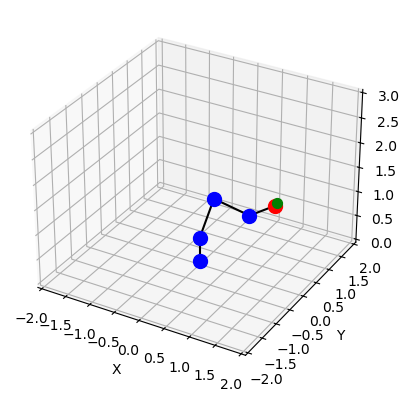

Episode 121/1000, Total Reward: -837756, Epsilon: 0.2726231770312959, steps: 5000 , Done: False
Link 1 Joint Angle: -1.4000000000000004
Link 2 Joint Angle: -2.3415926535897924
Link 3 Joint Angle: -2.6415926535897927
Link 4 Joint Angle: -3.141592653589793
End Effector: (-0.08109399557258813, 0.4701735563537513, 0.21518258290553915)


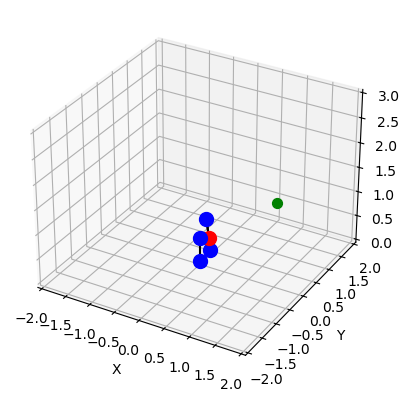

Episode 122/1000, Total Reward: 46950, Epsilon: 0.27126006114613943, steps: 2483 , Done: True
Link 1 Joint Angle: 0.8415926535897913
Link 2 Joint Angle: -0.5584073464102086
Link 3 Joint Angle: 1.1415926535897913
Link 4 Joint Angle: 0.8415926535897913
End Effector: (0.9454458541865186, 1.0581558975265268, 1.0113586446630023)


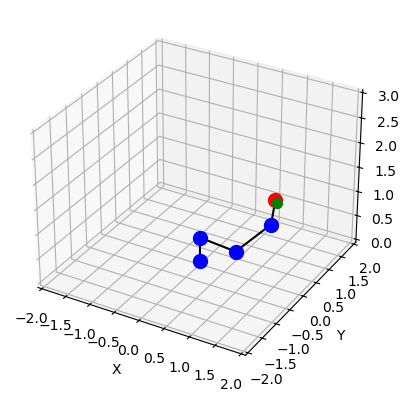

Episode 123/1000, Total Reward: -251750, Epsilon: 0.26990376084040874, steps: 5000 , Done: False
Link 1 Joint Angle: -0.9415926535897913
Link 2 Joint Angle: 1.1999999999999997
Link 3 Joint Angle: 1.841592653589792
Link 4 Joint Angle: 2.3415926535897924
End Effector: (-0.11494141525517175, 0.15790916645519082, 0.9338345472775021)


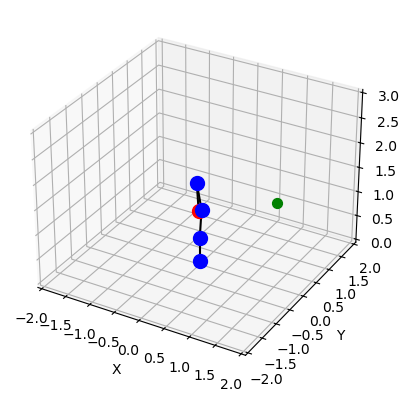

Episode 124/1000, Total Reward: 48134, Epsilon: 0.2685542420362067, steps: 1644 , Done: True
Link 1 Joint Angle: -2.3415926535897924
Link 2 Joint Angle: 2.5415926535897926
Link 3 Joint Angle: -0.19999999999999982
Link 4 Joint Angle: 2.0000000000000004
End Effector: (0.974562218740012, 1.0034468366592688, 1.059579308452034)


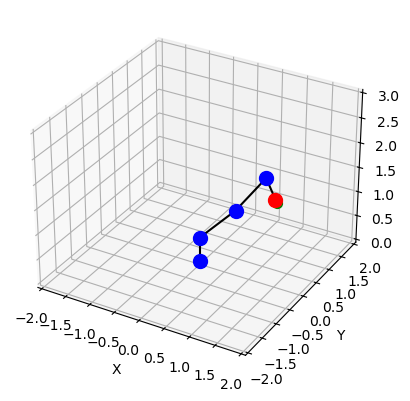

Episode 125/1000, Total Reward: -45090, Epsilon: 0.26721147082602564, steps: 4502 , Done: True
Link 1 Joint Angle: 0.7999999999999997
Link 2 Joint Angle: 1.1415926535897913
Link 3 Joint Angle: -1.7415926535897919
Link 4 Joint Angle: 1.1415926535897913
End Effector: (0.9904593945915254, 1.0198151818641947, 1.033474648655247)


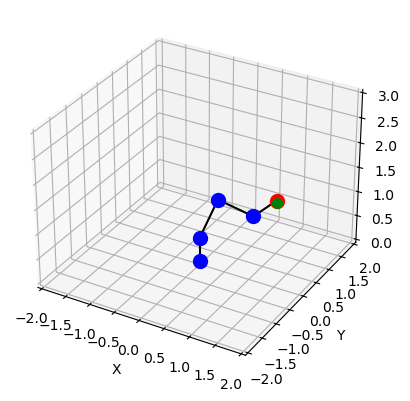

Episode 126/1000, Total Reward: 47638, Epsilon: 0.2658754134718955, steps: 2115 , Done: True
Link 1 Joint Angle: 0.8415926535897913
Link 2 Joint Angle: 1.3415926535897915
Link 3 Joint Angle: -1.7000000000000006
Link 4 Joint Angle: 0.3415926535897914
End Effector: (0.9533452717559473, 1.0669970334319856, 0.9900445723086811)


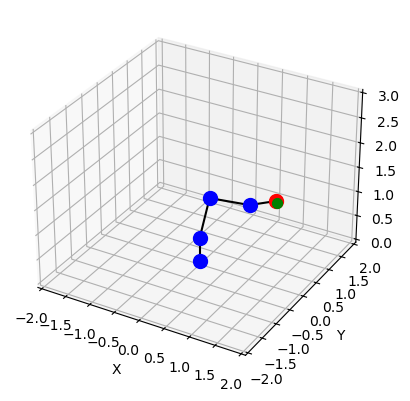

Episode 127/1000, Total Reward: 46150, Epsilon: 0.26454603640453606, steps: 3231 , Done: True
Link 1 Joint Angle: 0.7415926535897913
Link 2 Joint Angle: -0.5000000000000003
Link 3 Joint Angle: 1.0999999999999996
Link 4 Joint Angle: 0.8415926535897913
End Effector: (1.0520814895104582, 0.9637216782924625, 1.0640059530588994)


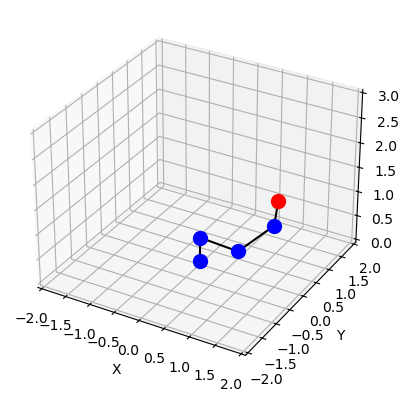

In [ ]:
import numpy as np
import random

class QLearningAgent:
    def __init__(self, env, alpha=0.1, gamma=0.99, epsilon=0.5, epsilon_decay=0.995, min_epsilon=0.01):
        self.env = env
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon
        self.epsilon_decay = epsilon_decay
        self.min_epsilon = min_epsilon
        self.q_table = {}
        self.all_rewards = []
        self.all_steps = []
        self.init_q_table()

    def init_q_table(self):
        for angle1 in range(-180, 181, 15):
            for angle2 in range(-180, 181, 15):
                for angle3 in range(-180, 181, 15):
                    for angle4 in range(-180, 181, 15):
                        self.q_table[(angle1, angle2, angle3, angle4)] = [0, 0]

    def discretize_state(self, state):
        return tuple([int(np.degrees(angle) // 15 * 15) for angle in state])

    def choose_action(self, state):
        if random.uniform(0, 1) < self.epsilon:
            return [random.choice([0, 1]) for _ in range(self.env.num_links)]
        else:
            return [np.argmax(self.q_table[state]) for _ in range(self.env.num_links)]

    def update_q_table(self, state, actions, reward, next_state):
        state = self.discretize_state(state)
        next_state = self.discretize_state(next_state)
        
        for i in range(len(actions)):
            old_value = self.q_table[state][actions[i]]
            next_max = np.max(self.q_table[next_state])
            new_value = (1 - self.alpha) * old_value + self.alpha * (reward + self.gamma * next_max)
            self.q_table[state][actions[i]] = new_value

    def train(self, episodes=1000):
        self.init_q_table()
        for episode in range(episodes):
            state = self.env.reset()
            done = False
            total_rewards = 0

            # while not done:
            for t in range(5000):
                state_disc = self.discretize_state(state)
                actions = self.choose_action(state_disc)
                # print(actions)
                # draw_robot([env.get_end_effector(1),env.get_end_effector(2),env.get_end_effector(3),env.get_end_effector(4)], env.target)
                next_state, reward, done = self.env.step(actions)
                self.update_q_table(state, actions, reward, next_state)

                state = next_state
                total_rewards += reward
                if done:
                    self.all_rewards.append(total_rewards)
                    self.all_steps.append(self.env.steps)
                    break
            self.epsilon = max(self.min_epsilon, self.epsilon * self.epsilon_decay)
            print(f"Episode {episode+1}/{episodes}, Total Reward: {total_rewards}, Epsilon: {self.epsilon}, steps: {self.env.steps} , Done: {done}")
            env.render()
            draw_robot([env.get_end_effector(1),env.get_end_effector(2),env.get_end_effector(3),env.get_end_effector(4)], env.target)

env = MultiArmRoboticEnv()
agent = QLearningAgent(env)
agent.train(episodes=1000)

env.render()

In [ ]:
plt.figure()
plt.rcParams['figure.figsize'] = [13, 13]
plt.plot(agent.all_rewards)

plt.xlabel('Episode')
plt.ylabel('Rewards')
plt.title('Rewards')
plt.savefig('Qrewards', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
success_percentage = len(agent.all_rewards) / 1000 *100;
print(success_percentage)